## The attached code is a run of the Decision_Tree_Regressor model on data from booking without the addition of new features

Columns used by the model:
 Index(['score', 'reviews', 'los', 'star_rating', 'location_rating',
       'Free_cancellation', 'Limited_rooms', 'TTT', 'Breakfast', 'index',
       'km_from_center', 'room_rate', 'LOS'],
      dtype='object')
Decision Tree Regressor Results:
   Depth  Train R2  Train RMSE     Train MSE  Train MAE   Test R2   Test RMSE  \
0      5  0.890195  132.931270  17670.722578  97.462255  0.887519  134.313446   
1      6  0.920466  113.133382  12799.162038  81.276240  0.917809  114.813508   
2      7  0.940164   98.128453   9629.193279  70.298474  0.938269   99.502357   
3      8  0.951979   87.908571   7727.916886  62.777112  0.948797   90.620442   
4     10  0.970048   69.427160   4820.130501  48.882894  0.965383   74.512120   
5     12  0.980291   56.317947   3171.711139  37.378767  0.974187   64.342695   
6     13  0.984167   50.476694   2547.896599  31.838955  0.976753   61.061252   
7     14  0.987648   44.585219   1987.841778  26.584678  0.978725   58.413482   


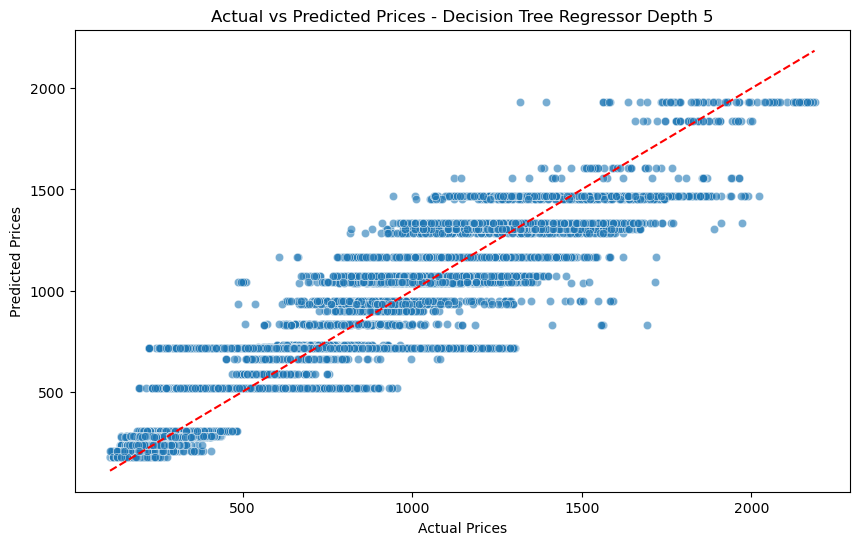

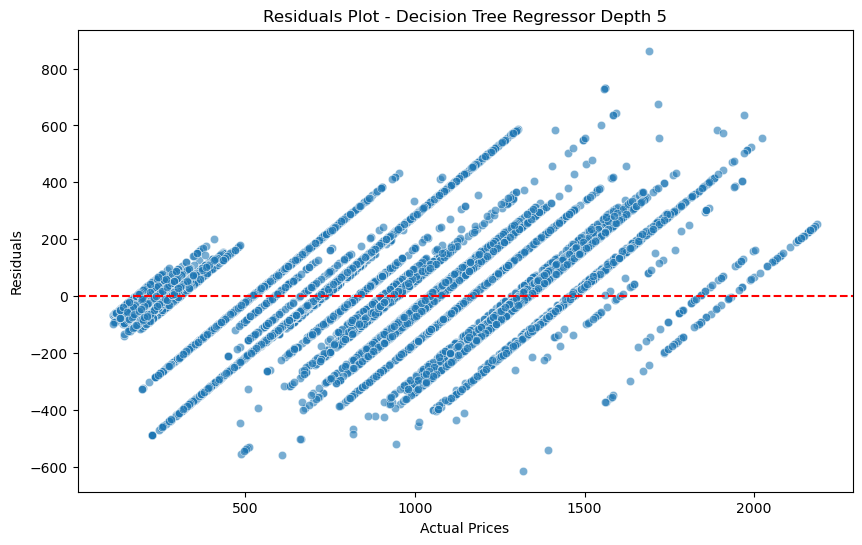

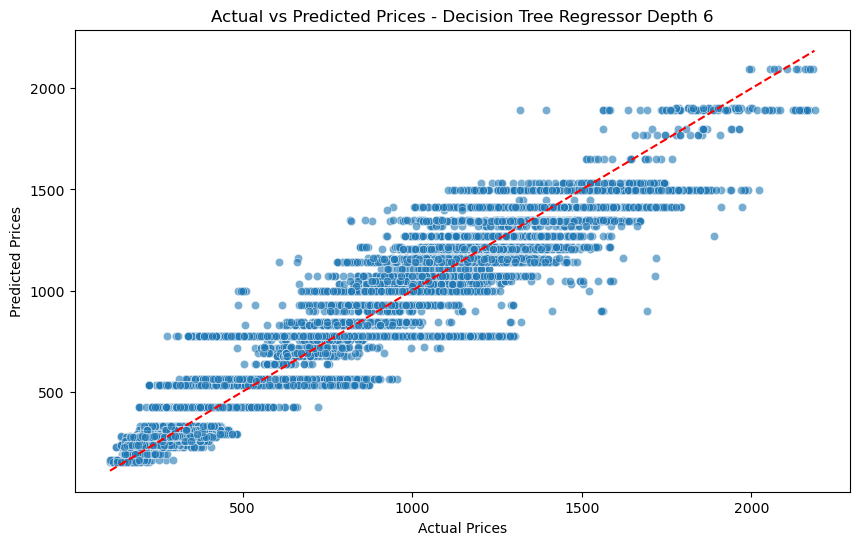

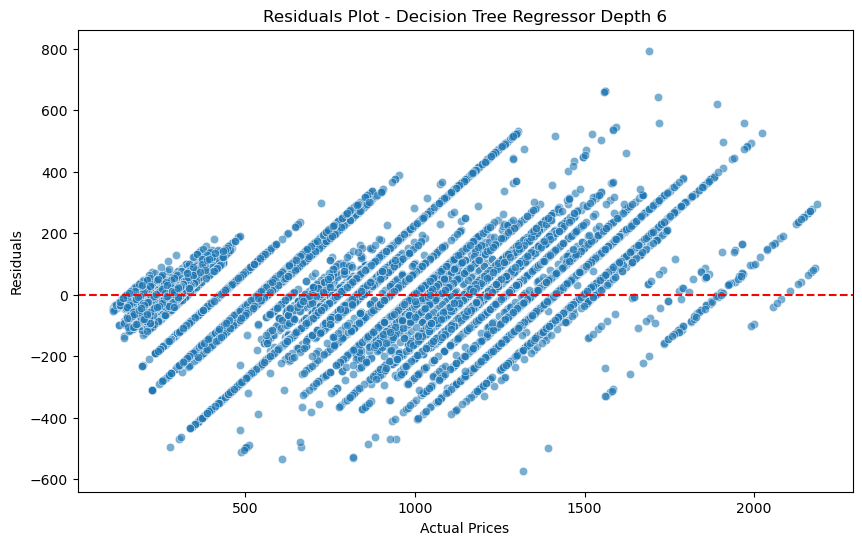

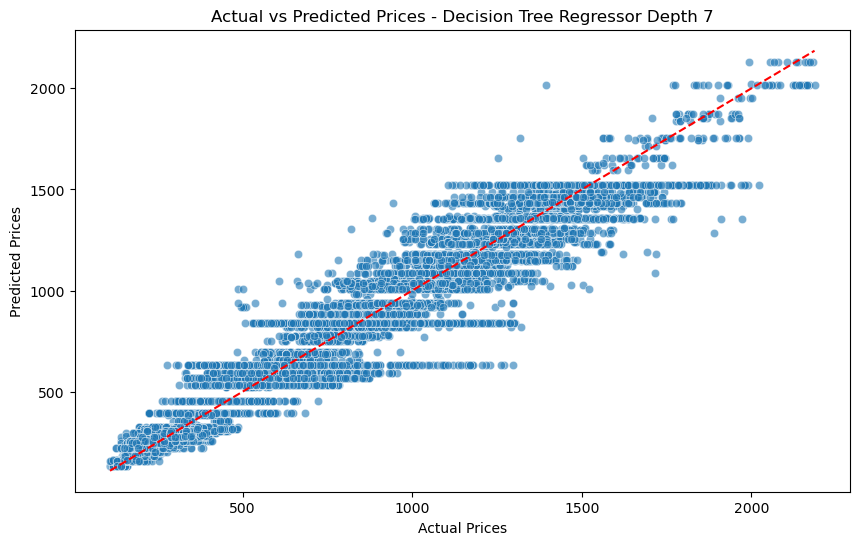

...

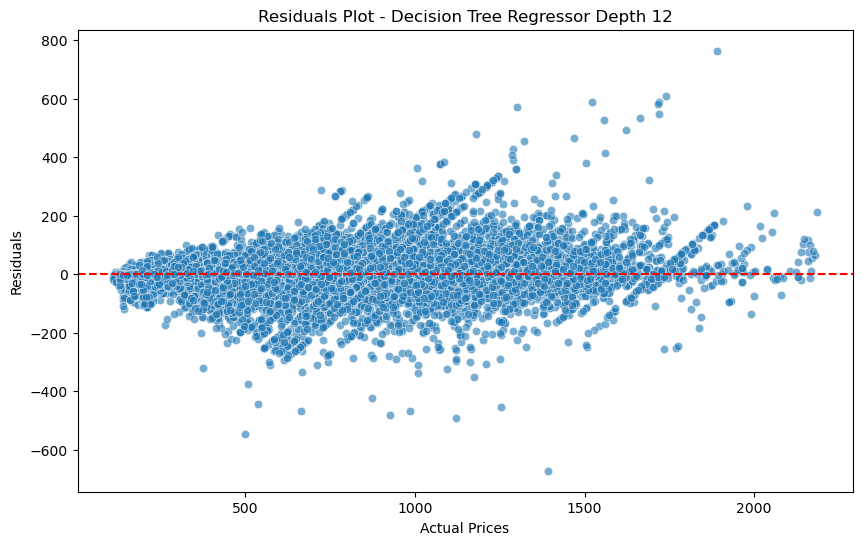

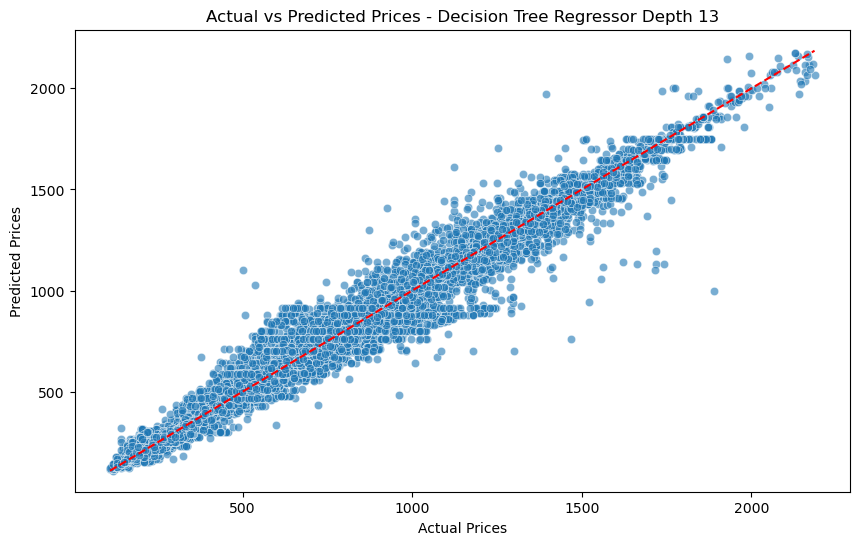

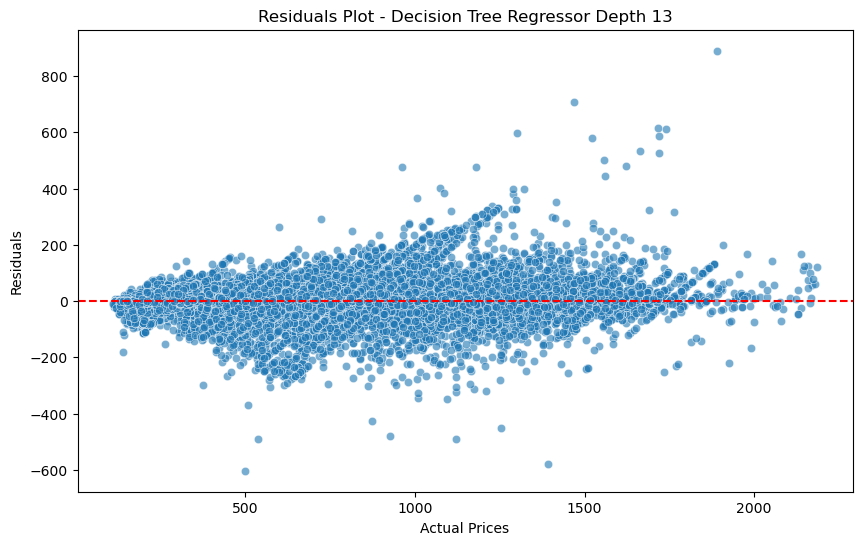

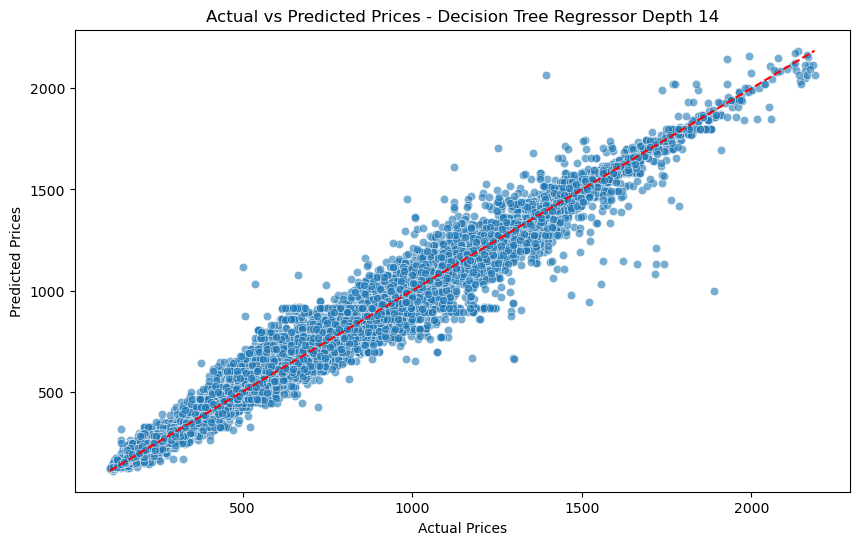

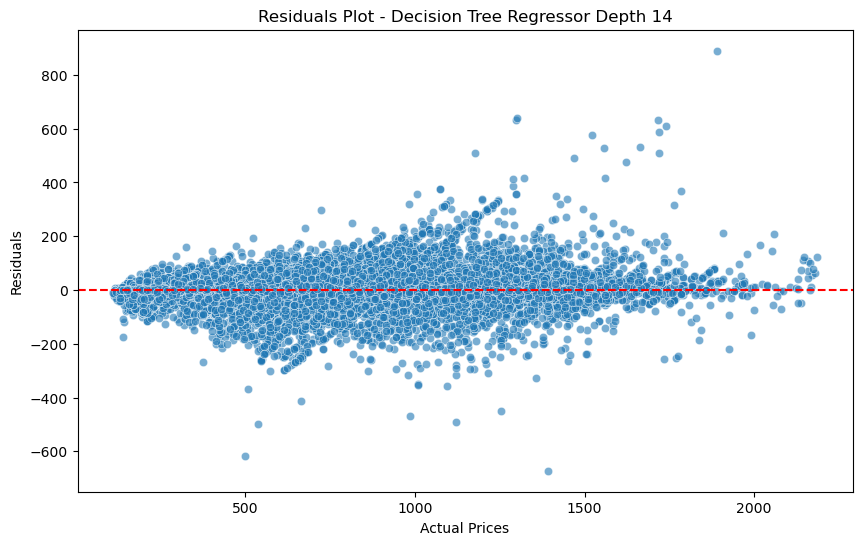

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.tree import DecisionTreeRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df1 = pd.read_csv('./0507_cleaned_booking_hotels.csv')
df2 = pd.read_csv('./2506_cleaned_booking_hotels.csv')
df3 = pd.read_csv('./20_06_hotels_data_cleaned.csv')

# Merge the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Function to fill NaN values with the mean of the group
def fill_na_with_group_mean(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        df[col].fillna(df[col].mean(), inplace=True)
    return df

# Fill NaN values for the entire dataset
df = fill_na_with_group_mean(df)

# Keep only numeric columns
df = df.select_dtypes(include=[np.number])

# Remove columns with all NaN values
df = df.dropna(axis=1, how='all')

# Remove the price column
if 'price_per_night' in df.columns:
    df = df.drop(columns=['price_per_night'])

# Ensure there are no remaining NaN values
imputer = SimpleImputer(strategy='mean')
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Split the data into train and test sets
X = df.drop(columns=['price'])
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Print all the columns that the model uses
print("Columns used by the model:\n", X.columns)

# Initialize models with different depths
depths = [5,6,7,8, 10, 12, 13, 14]
results = []
predictions = {}
feature_importance = {}

# Custom scoring function
scoring = {
    'r2': 'r2',
    'mse': make_scorer(mean_squared_error),
    'mae': make_scorer(mean_absolute_error),
    'rmse': make_scorer(mean_squared_error, squared=False)
}

for depth in depths:
    model = DecisionTreeRegressor(max_depth=depth)
    model.fit(X_train, y_train)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Training metrics
    train_r2 = r2_score(y_train, y_train_pred)
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_mae = mean_absolute_error(y_train, y_train_pred)

    # Test metrics
    test_r2 = r2_score(y_test, y_test_pred)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    # Perform cross-validation and calculate the mean cross-validation scores
    cv_results = cross_validate(model, X_train, y_train, cv=5, scoring=scoring)
    cv_mean_r2 = cv_results['test_r2'].mean()
    cv_mean_mse = cv_results['test_mse'].mean()
    cv_mean_mae = cv_results['test_mae'].mean()
    cv_mean_rmse = cv_results['test_rmse'].mean()

    results.append({
        'Depth': depth,
        'Train R2': train_r2,
        'Train RMSE': train_rmse,
        'Train MSE': train_mse,
        'Train MAE': train_mae,
        'Test R2': test_r2,
        'Test RMSE': test_rmse,
        'Test MSE': test_mse,
        'Test MAE': test_mae,
        'CV Mean R2': cv_mean_r2,
        'CV Mean MSE': cv_mean_mse,
        'CV Mean MAE': cv_mean_mae,
        'CV Mean RMSE': cv_mean_rmse
    })

    # Store predictions for plotting
    predictions[f'Depth {depth}'] = (y_test, y_test_pred)



# Convert results to DataFrame and display
results_df = pd.DataFrame(results)
print("Decision Tree Regressor Results:")
print(results_df)

# Plot actual vs predicted prices for each depth
for model_name, (y_test, y_pred) in predictions.items():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title(f'Actual vs Predicted Prices - Decision Tree Regressor {model_name}')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.show()

    # Residual plot
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=residuals, alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Prices')
    plt.ylabel('Residuals')
    plt.title(f'Residuals Plot - Decision Tree Regressor {model_name}')
    plt.show()



## Conclusions from running the model without new features:
In the described code we ran the algorithm without new features, we saw with the help of the cross-validation that even if we reach depths as high as 12 there is no tendency to overfit, on the other hand at a depth of 14 we have already seen that the average MAE value in the cross-validation (37) is significantly greater than the MAE value in the training group (26) and also Slightly greater than the MAE value in the test group (35) and this could be a sign of overfit, therefore the ideal depth for us is 12 for these data.

## The attached code is a run of the Decision Tree Regressor model on booking data with additions of new features and after we have done one hot encoding for them (a period of the month - beginning, middle and end, day of the week of check in, day of the week of check out)

Columns used by the model:
 Index(['score', 'reviews', 'los', 'star_rating', 'location_rating',
       'Free_cancellation', 'Limited_rooms', 'TTT', 'Breakfast', 'index',
       'km_from_center', 'room_rate', 'checkin_day_name_Friday',
       'checkin_day_name_Monday', 'checkin_day_name_Saturday',
       'checkin_day_name_Sunday', 'checkin_day_name_Thursday',
       'checkin_day_name_Tuesday', 'checkin_day_name_Wednesday',
       'checkout_day_name_Friday', 'checkout_day_name_Monday',
       'checkout_day_name_Saturday', 'checkout_day_name_Sunday',
       'checkout_day_name_Thursday', 'checkout_day_name_Tuesday',
       'checkout_day_name_Wednesday',
       'period_of_the_month_beginning of the month',
       'period_of_the_month_end of the month',
       'period_of_the_month_middle of the month', 'LOS'],
      dtype='object')
Decision Tree Regressor Results:
   Depth  Train R2  Train RMSE     Train MSE   Train MAE   Test R2  \
0      4  0.861787  151.421484  22928.465953  113.022273  0

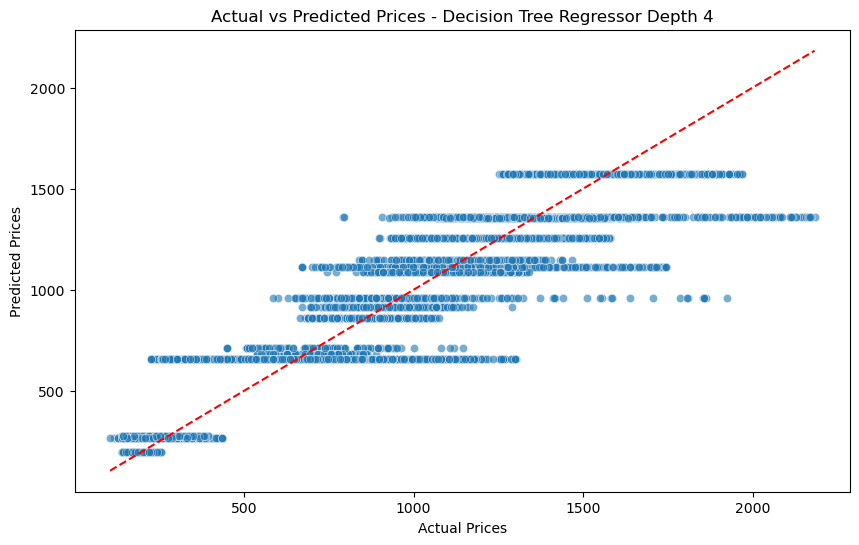

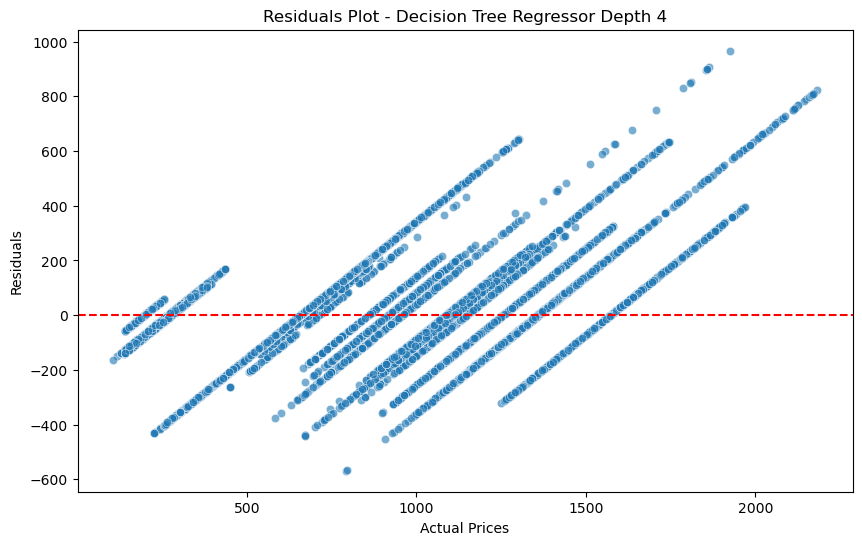

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


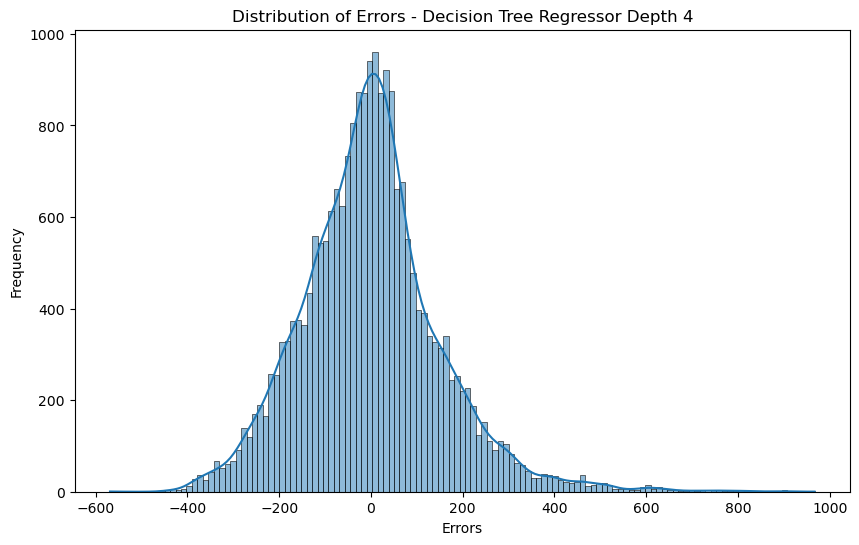

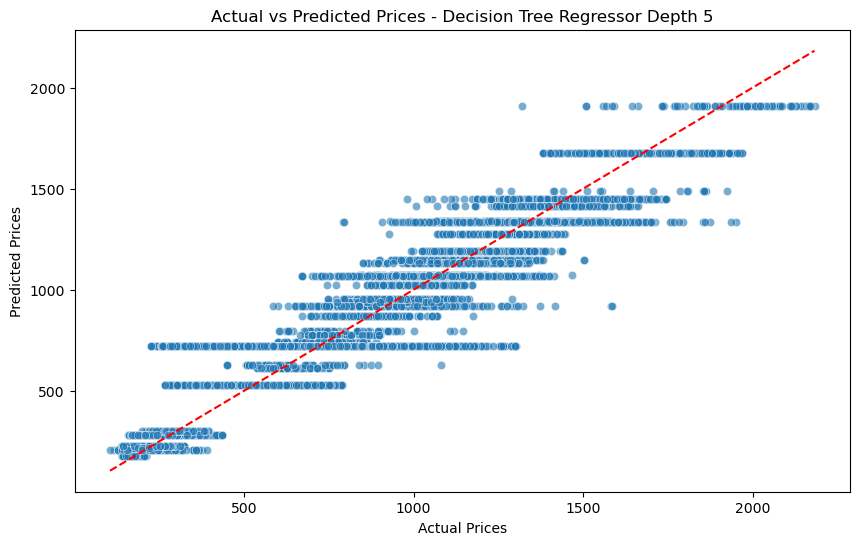

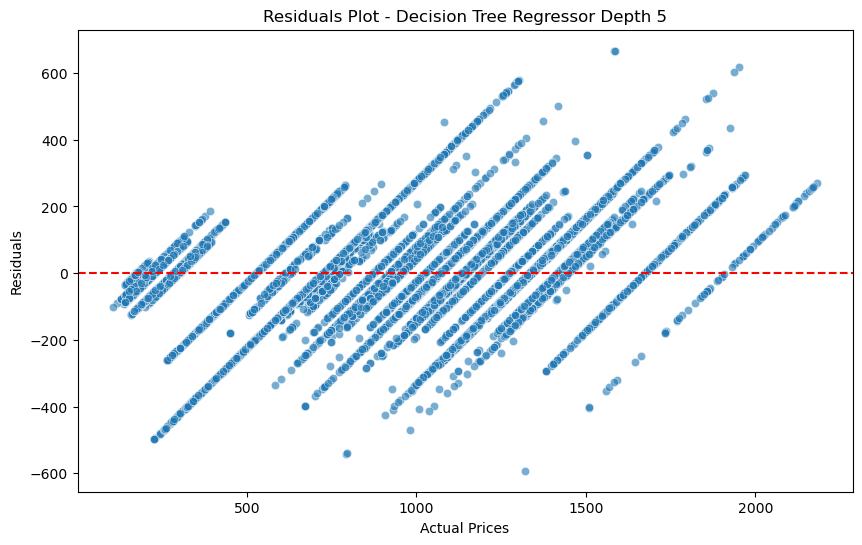

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


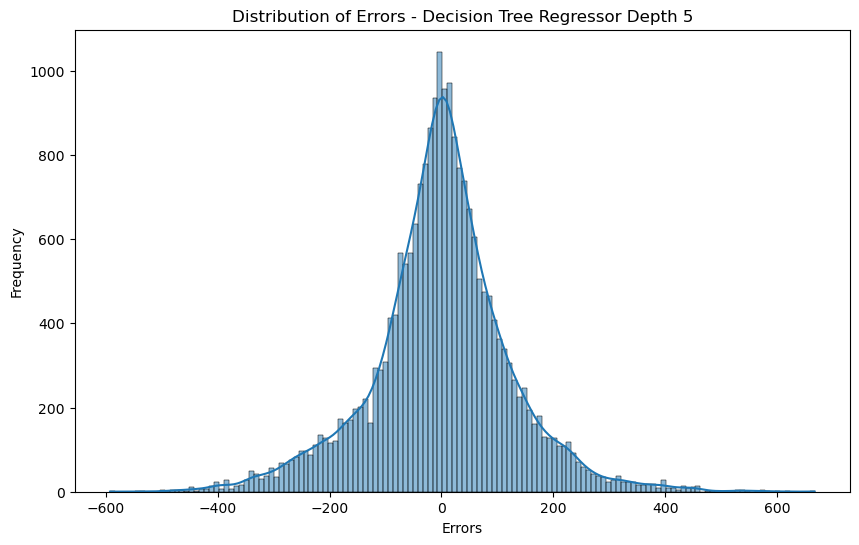

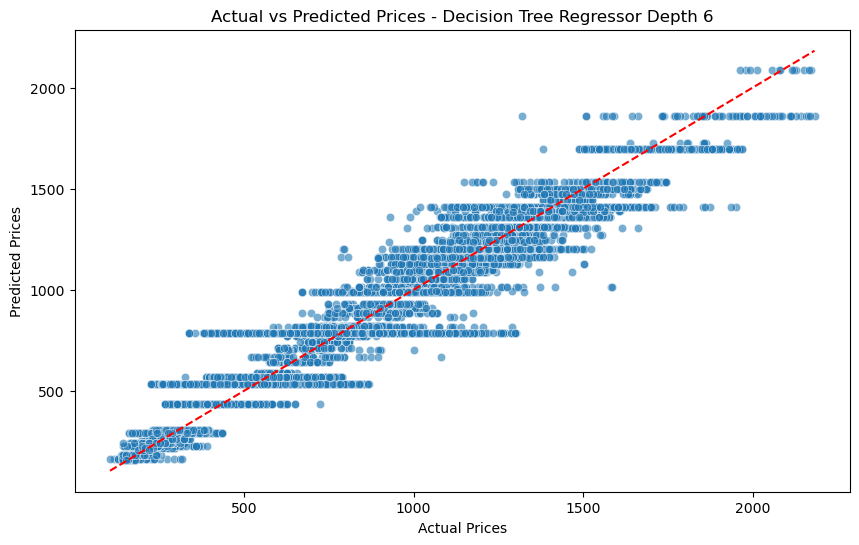

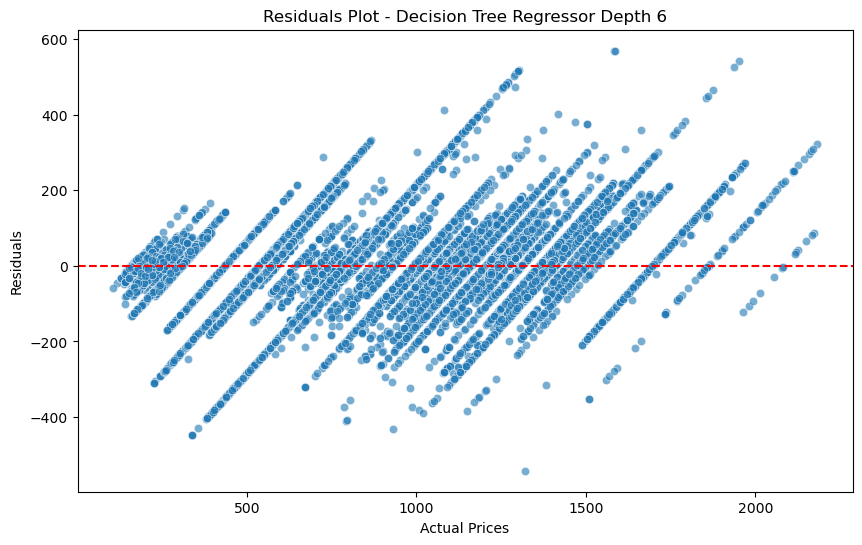

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


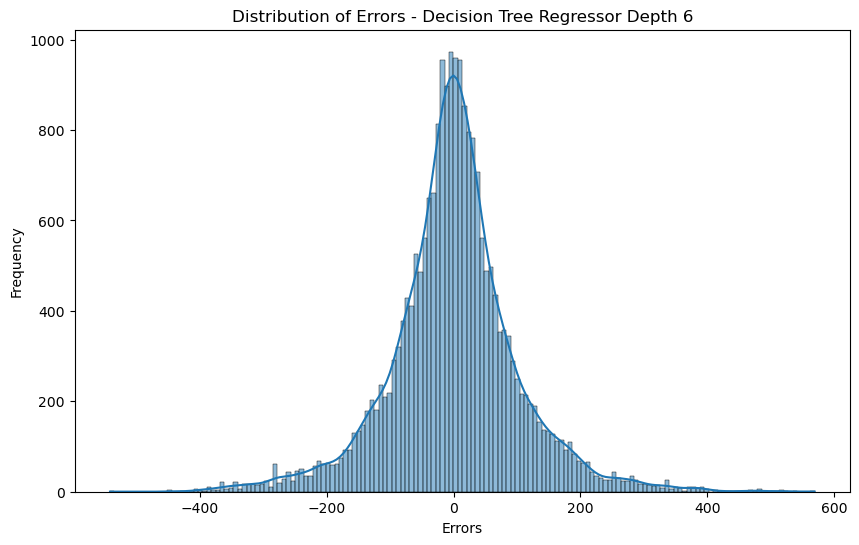

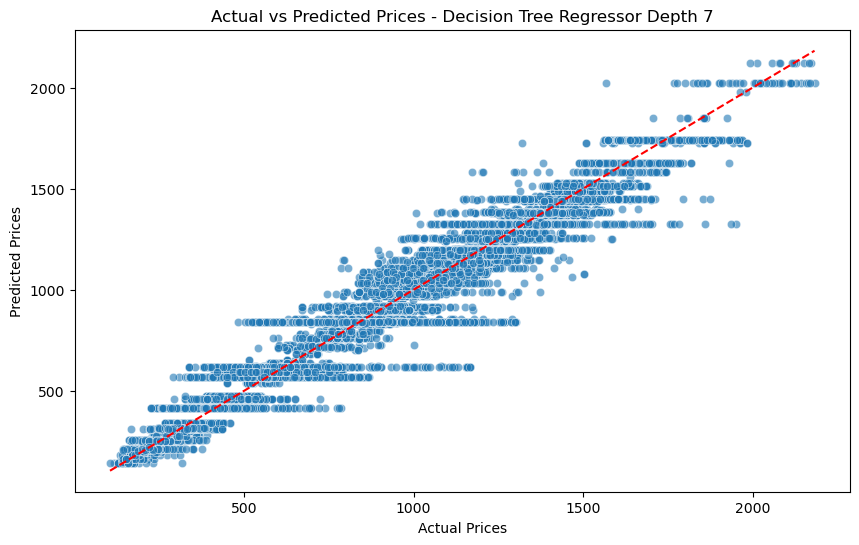

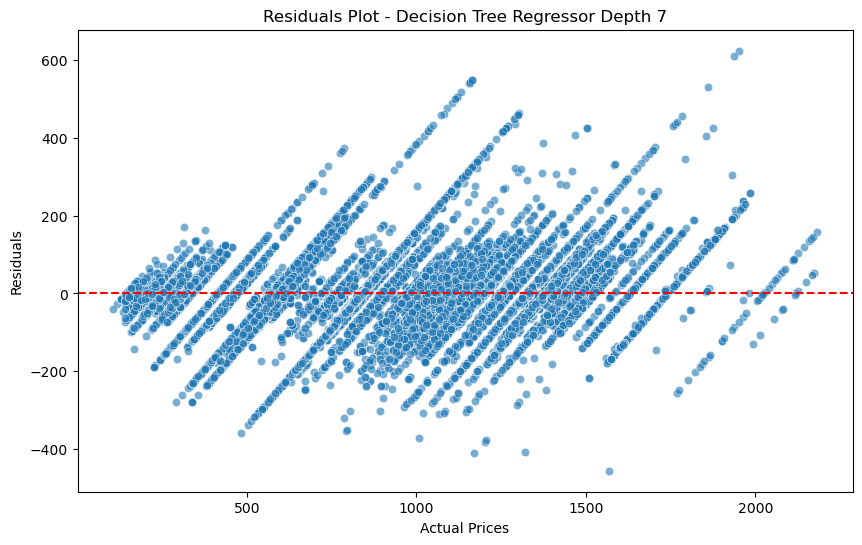

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


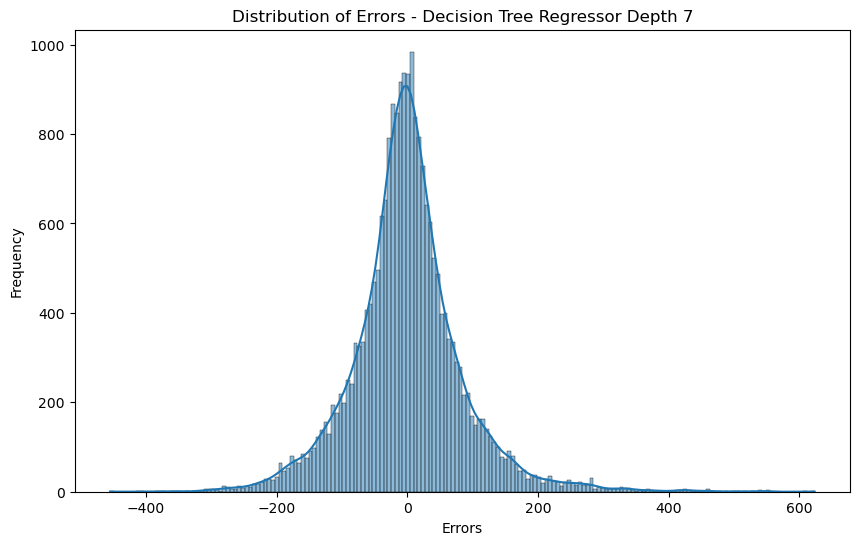

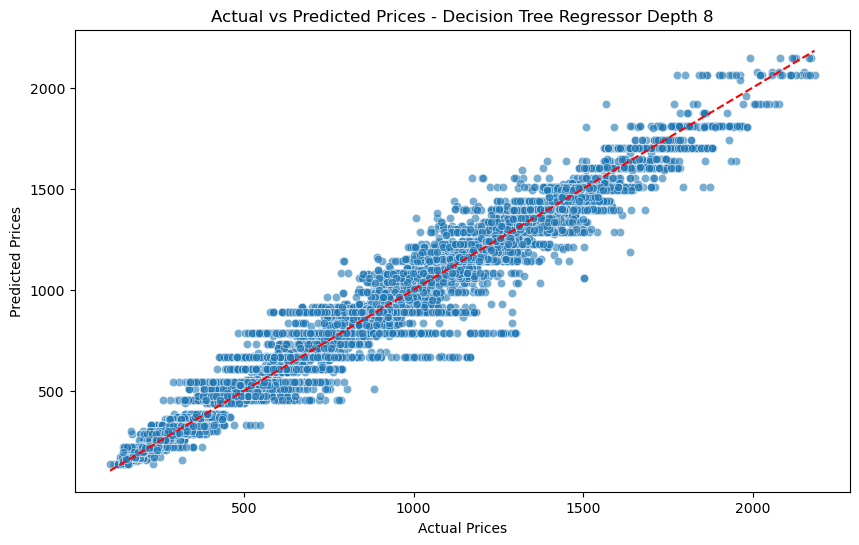

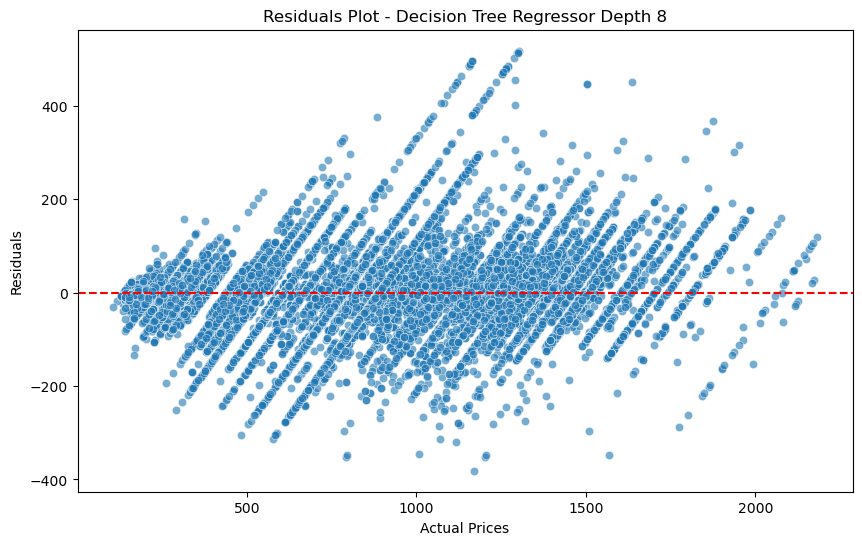

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


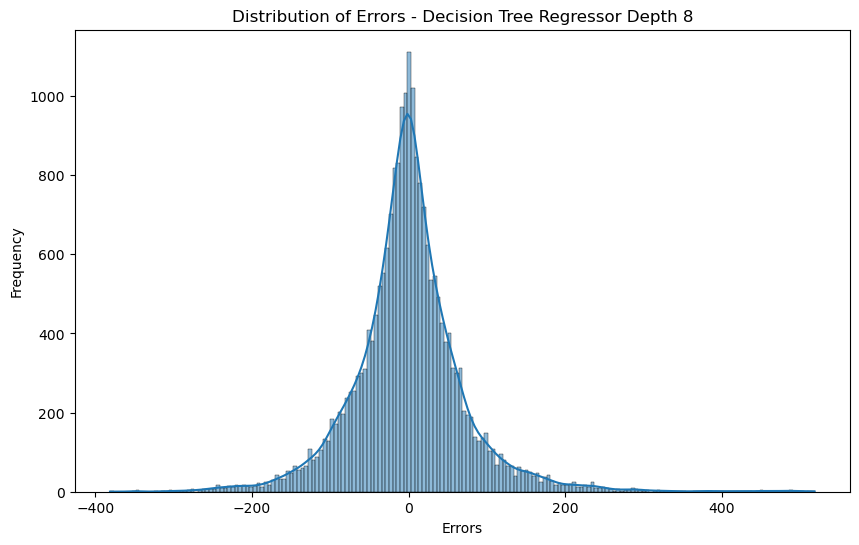

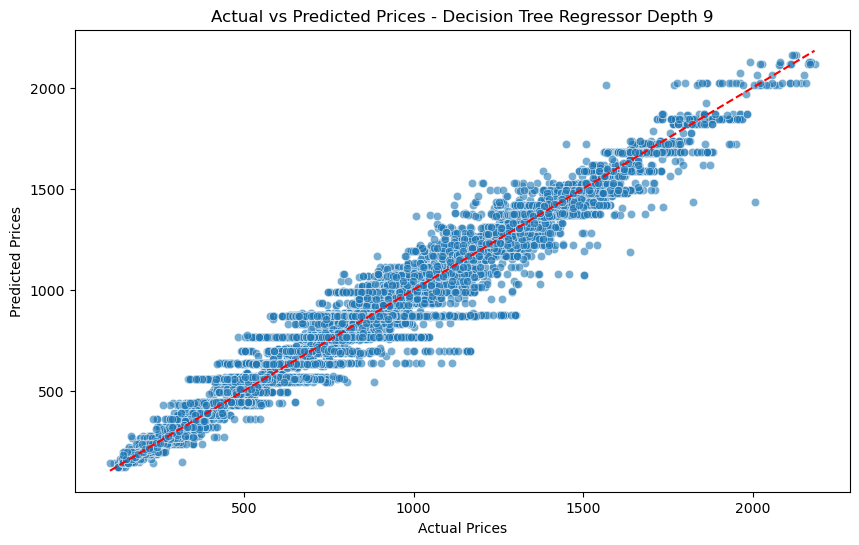

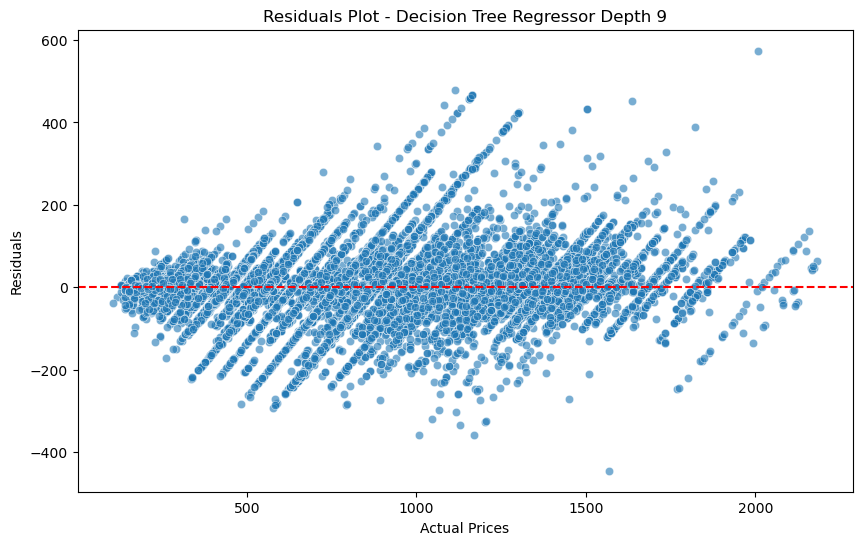

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


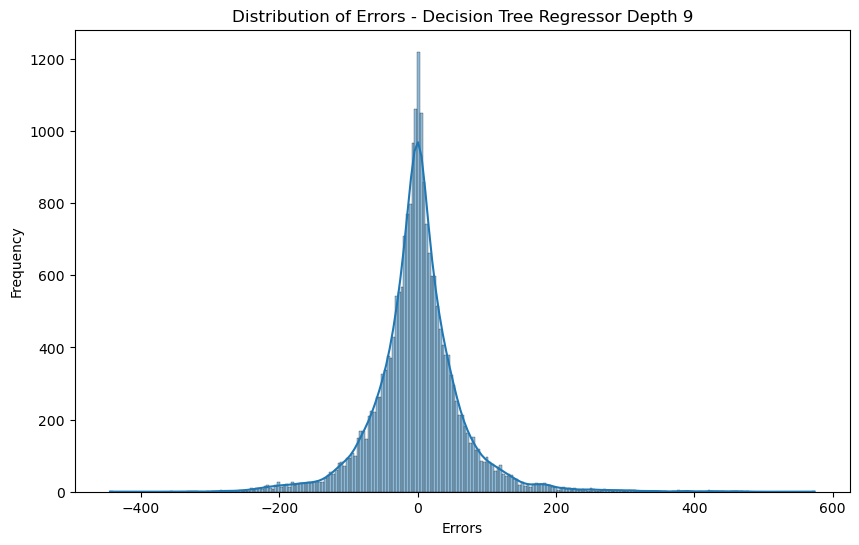

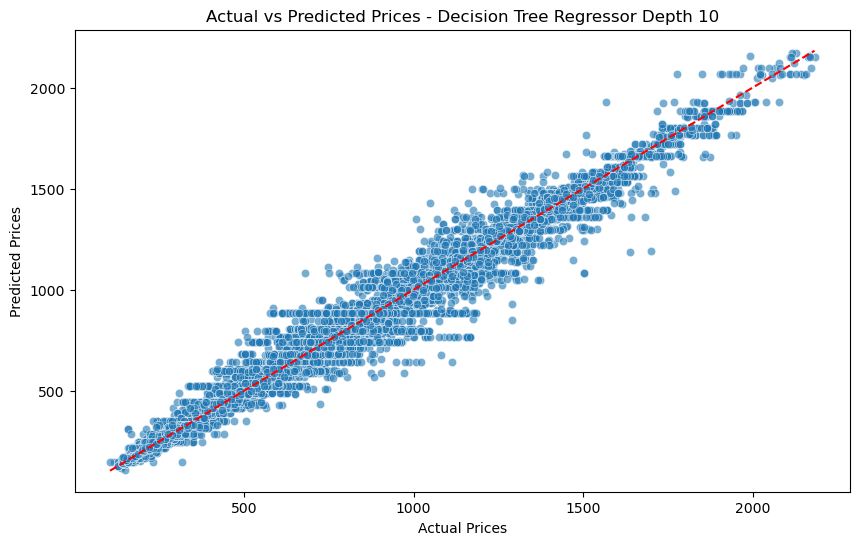

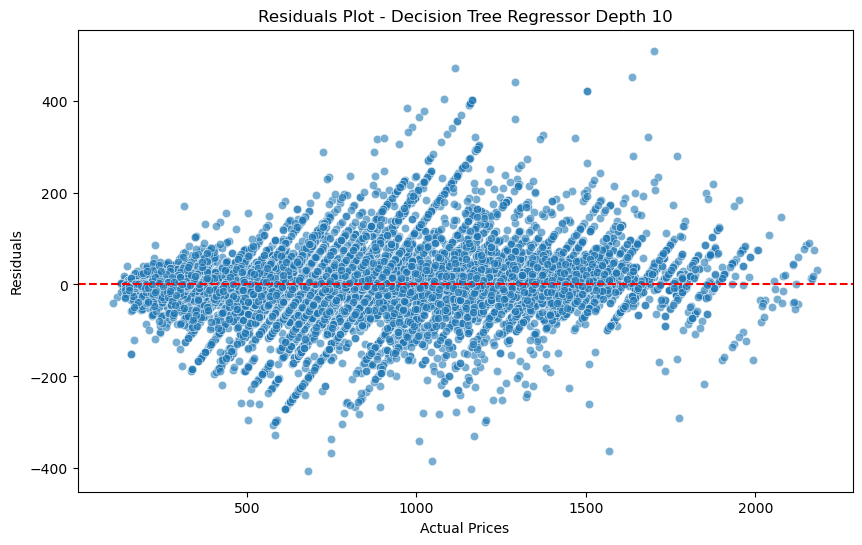

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


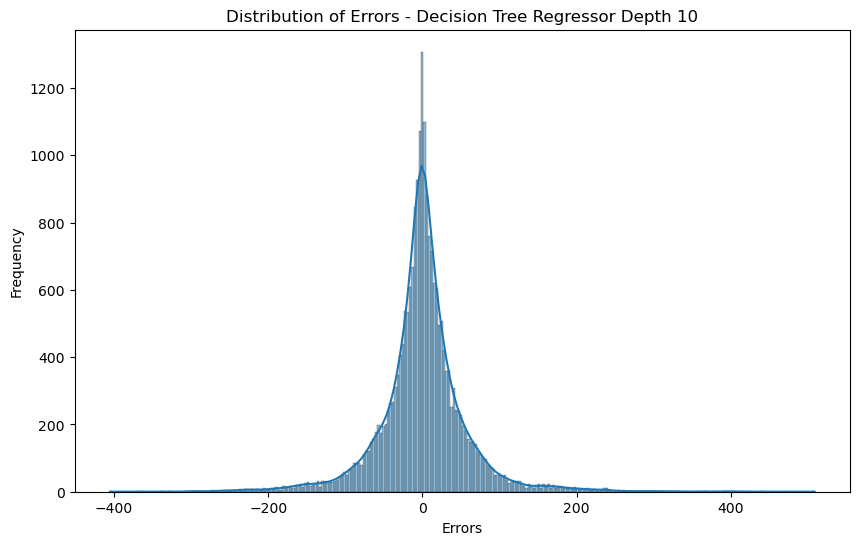

In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy

# Load the data
df1 = pd.read_csv('./05_07_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
df2 = pd.read_csv('./25_06_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
df3 = pd.read_csv('./20_06_hotels_data_cleaned_with_new_parameters_encoded.csv')

# Merge the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Function to fill NaN values with the mean of the group
def fill_na_with_group_mean(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        df[col].fillna(df[col].mean(), inplace=True)
    return df

# Fill NaN values for the entire dataset
df = fill_na_with_group_mean(df)

# Keep only numeric columns
df = df.select_dtypes(include=[np.number])

# Remove columns with all NaN values
df = df.dropna(axis=1, how='all')

# Remove the price column
if 'price_per_night' in df.columns:
    df = df.drop(columns=['price_per_night'])
if 'checkout_day' in df.columns:
    df = df.drop(columns=['checkout_day'])
if 'checkin_day' in df.columns:
    df = df.drop(columns=['checkin_day'])
    
# Ensure there are no remaining NaN values
imputer = SimpleImputer(strategy='mean')
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Split the data into train and test sets
X = df.drop(columns=['price'])
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Print all the columns that the model uses
print("Columns used by the model:\n", X.columns)

# Initialize models with different depths
depths = [4, 5, 6, 7,8,9,10]
results = []
predictions = {}
feature_importance = {}

# Define custom scorers
mse_scorer = make_scorer(mean_squared_error)
mae_scorer = make_scorer(mean_absolute_error)
rmse_scorer = make_scorer(mean_squared_error, squared=False)

for depth in depths:
    model = DecisionTreeRegressor(max_depth=depth)

    # Perform cross-validation
    r2_scores = cross_val_score(model, X, y, cv=5, scoring='r2')
    mse_scores = cross_val_score(model, X, y, cv=5, scoring=mse_scorer)
    mae_scores = cross_val_score(model, X, y, cv=5, scoring=mae_scorer)
    rmse_scores = cross_val_score(model, X, y, cv=5, scoring=rmse_scorer)

    # Train the model
    model.fit(X_train, y_train)

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Training metrics
    train_r2 = r2_score(y_train, y_train_pred)
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    train_mse = mean_squared_error(y_train, y_train_pred)
    train_mae = mean_absolute_error(y_train, y_train_pred)

    # Test metrics
    test_r2 = r2_score(y_test, y_test_pred)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    results.append({
        'Depth': depth,
        'Train R2': train_r2,
        'Train RMSE': train_rmse,
        'Train MSE': train_mse,
        'Train MAE': train_mae,
        'Test R2': test_r2,
        'Test RMSE': test_rmse,
        'Test MSE': test_mse,
        'Test MAE': test_mae,
        'CV R2': np.mean(r2_scores),
        'CV RMSE': np.mean(rmse_scores),
        'CV MSE': np.mean(mse_scores),
        'CV MAE': np.mean(mae_scores)
    })

    # Store predictions for plotting
    predictions[f'Depth {depth}'] = (y_test, y_test_pred)

    # For depth 12, store feature importance
    if depth == 12:
        feature_importance = model.feature_importances_

# Convert results to DataFrame and display
results_df = pd.DataFrame(results)
print("Decision Tree Regressor Results:")
print(results_df)

# Plot actual vs predicted prices for each depth
for model_name, (y_test, y_pred) in predictions.items():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title(f'Actual vs Predicted Prices - Decision Tree Regressor {model_name}')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.show()

    # Residual plot
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=residuals, alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Prices')
    plt.ylabel('Residuals')
    plt.title(f'Residuals Plot - Decision Tree Regressor {model_name}')
    plt.show()


    # Plot error distribution for the current model
    errors = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.histplot(errors, kde=True)
    plt.xlabel('Errors')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Errors - Decision Tree Regressor {model_name}')
    plt.show()




## summary and Conclusions:
In this notebook we tried to run regression decision trees at several different depths.
It could be seen, as in most of the models we ran, that the addition of the features (we added a check-in day, a check-out day, a period of the month) helped improve the performance of the algorithm significantly.


 In conclusion, we can say that as we increased the depth of the tree up to a depth of 14, the results did improve and this is an excellent algorithm for our problem. where its errors are very low and its R2 score is very high. (0.96 in depth 14 with the features we added).
It may even be more correct to use a tree with a lower depth (12 or 13) in order to extend the capabilities of the algorithms to obtain good results for anomalies since this does not significantly affect the R2 score.

Regarding the distribution of errors it can be seen that it is normal and this is a sign of the high quality of the model results.

### Another task in phase 3 of the project
In the attached code we made a different division of train, test according to the instructions:
The training group contains all the rows in the data in which the TTT values ​​are less than or equal to 25,
And the test group contains all the rows in which the TTT values ​​are greater than 25.
This division is done in order to test the ability to predict the prices in the "future".

 We performed this division for trees of different depths -14,12 in order to see if it is possible to avoid a situation of overtraining that is possible for very deep trees.

Depth 4:
Training set - R²: 0.8628237097265218, RMSE: 151.07524998822964, MAE: 112.59459814098585
Test set - R²: 0.8661490119753654, RMSE: 150.61041692549063, MAE: 111.96359339066387


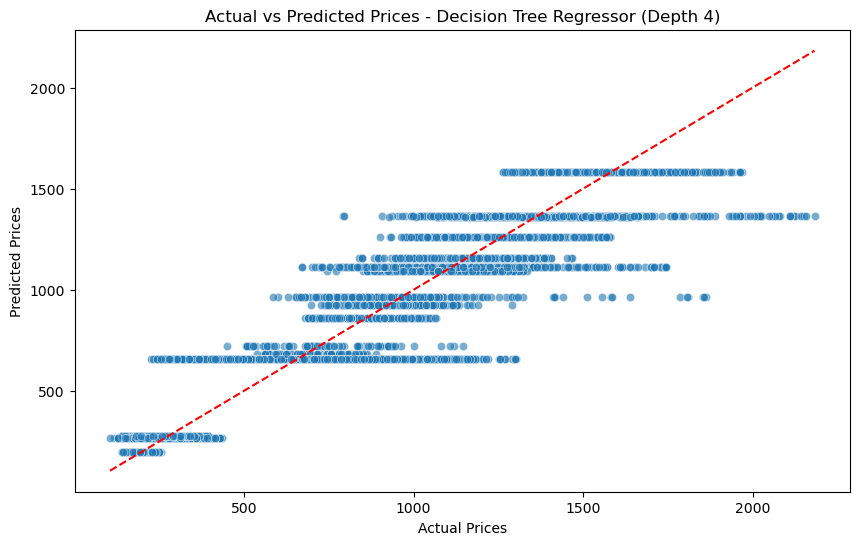

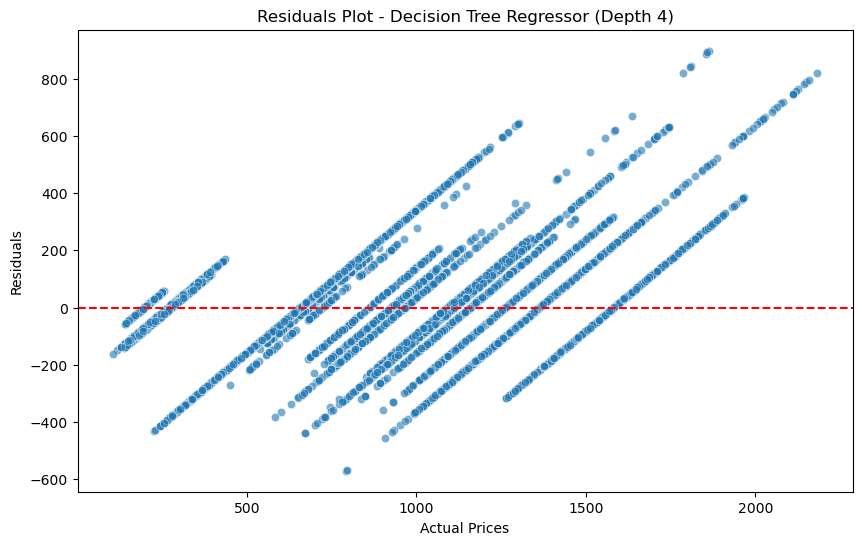

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


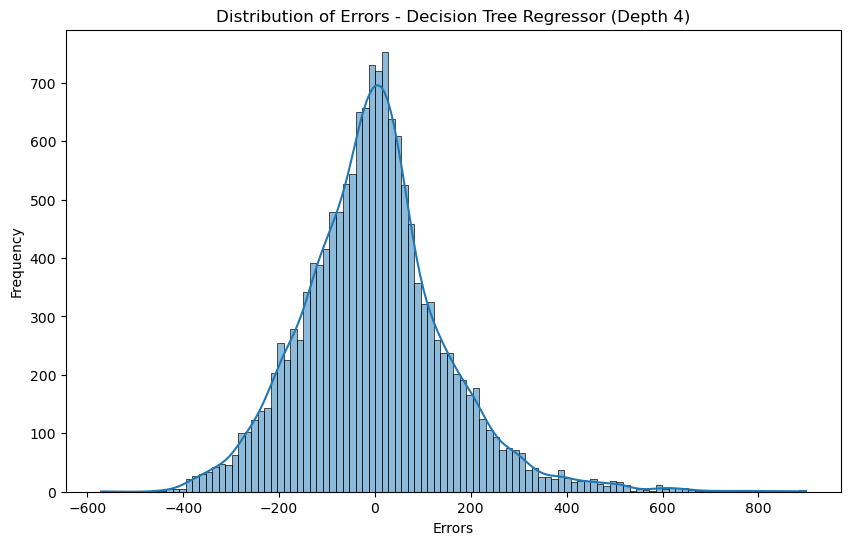

Depth 5:
Training set - R²: 0.9053752214721071, RMSE: 125.47471926000006, MAE: 90.19403064119892
Test set - R²: 0.9078639139624711, RMSE: 124.95657123240183, MAE: 90.09997049298835


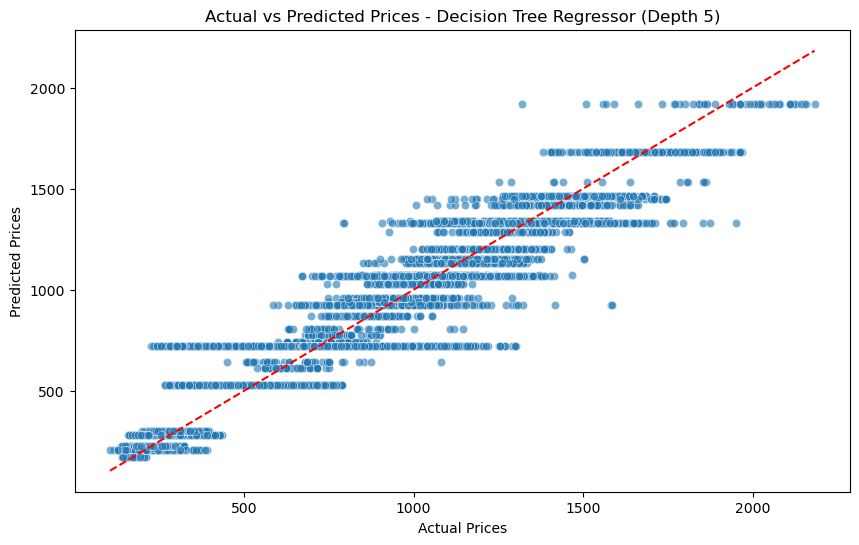

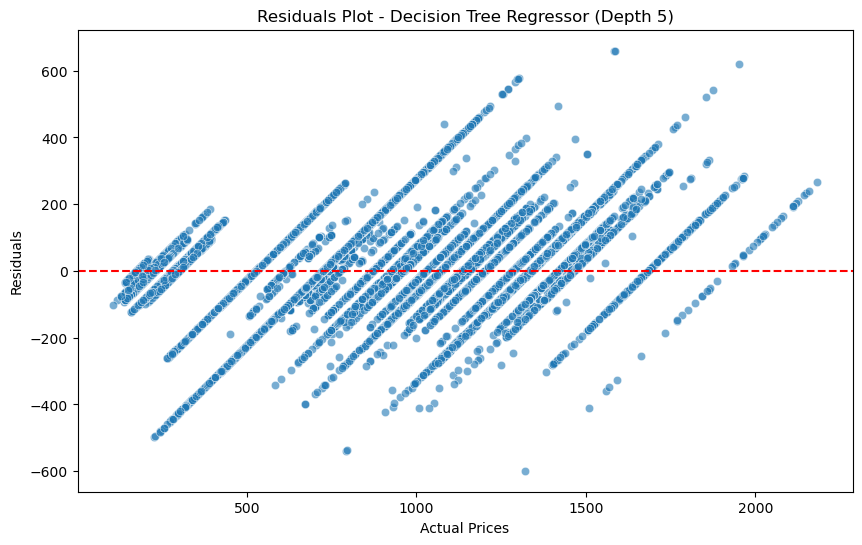

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


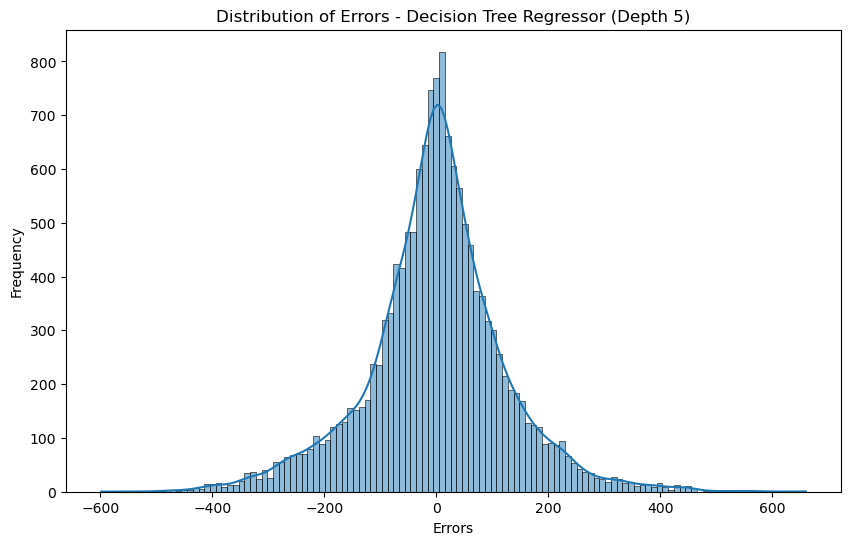

Depth 6:
Training set - R²: 0.9373887053737547, RMSE: 102.06577476459648, MAE: 71.86112846880484
Test set - R²: 0.9383920863409749, RMSE: 102.17919361826824, MAE: 72.17386540696776


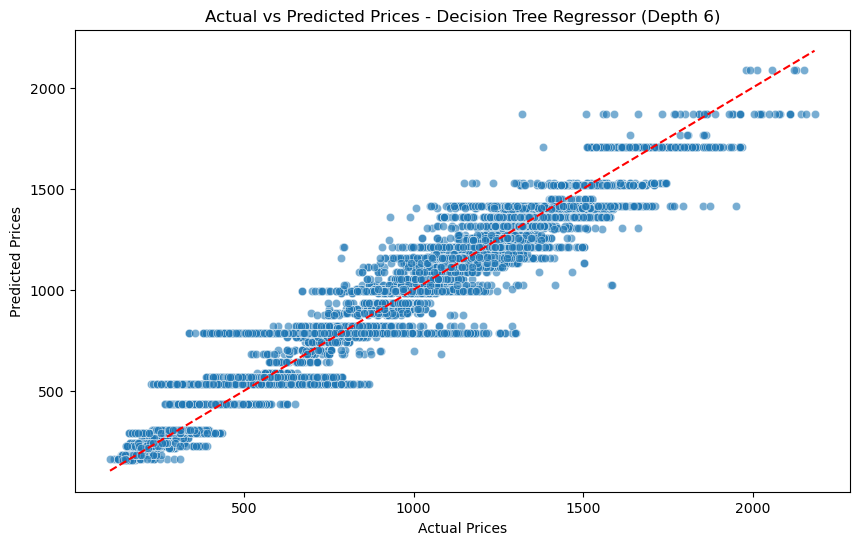

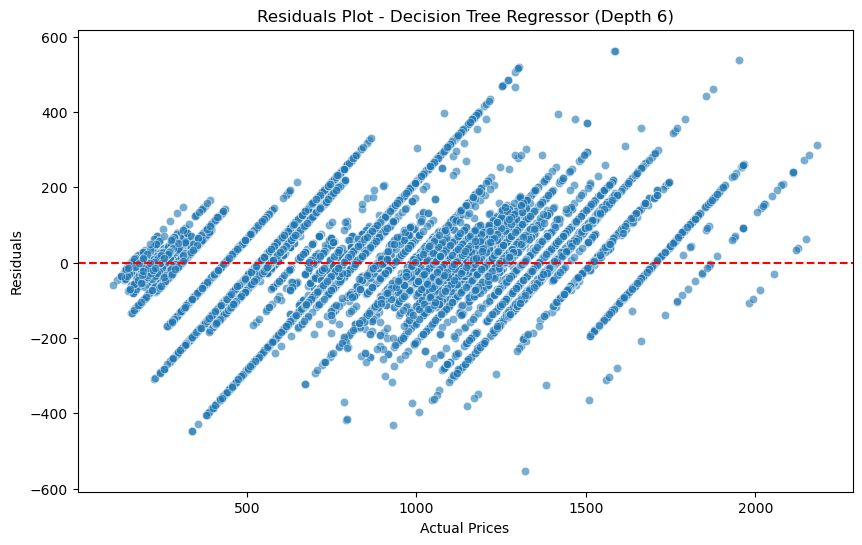

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


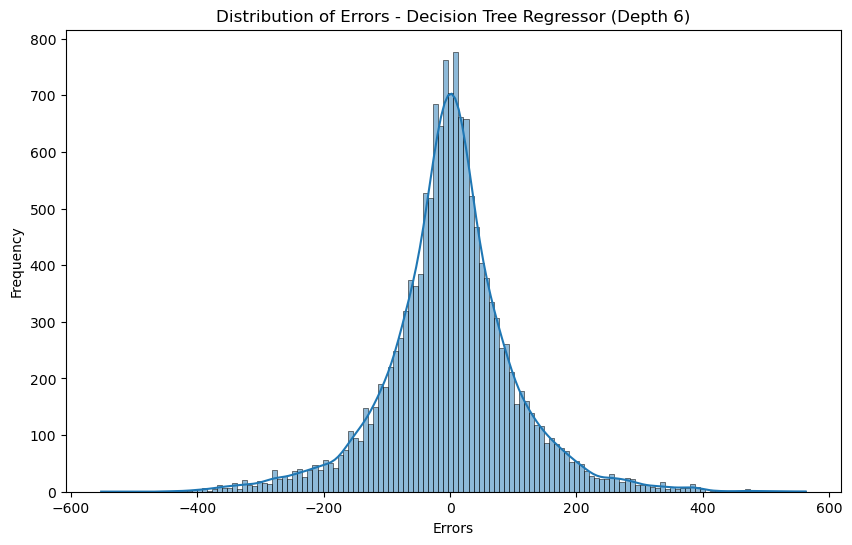

Depth 7:
Training set - R²: 0.957816134471207, RMSE: 83.77741997036544, MAE: 58.771490676713945
Test set - R²: 0.9572445585215239, RMSE: 85.12162732070043, MAE: 59.81938269027595


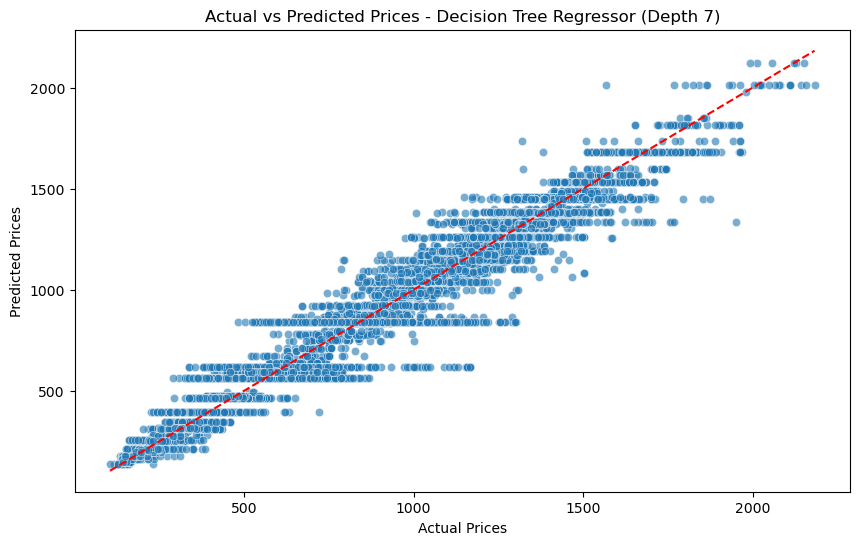

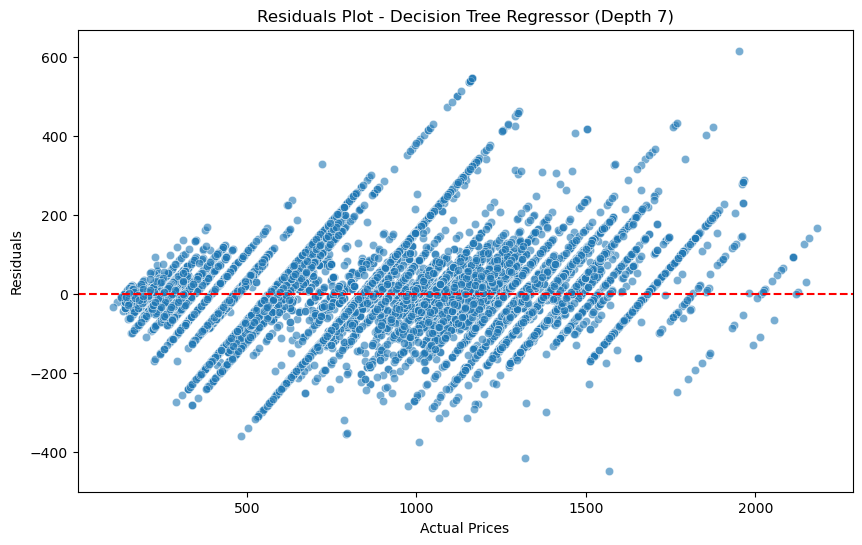

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


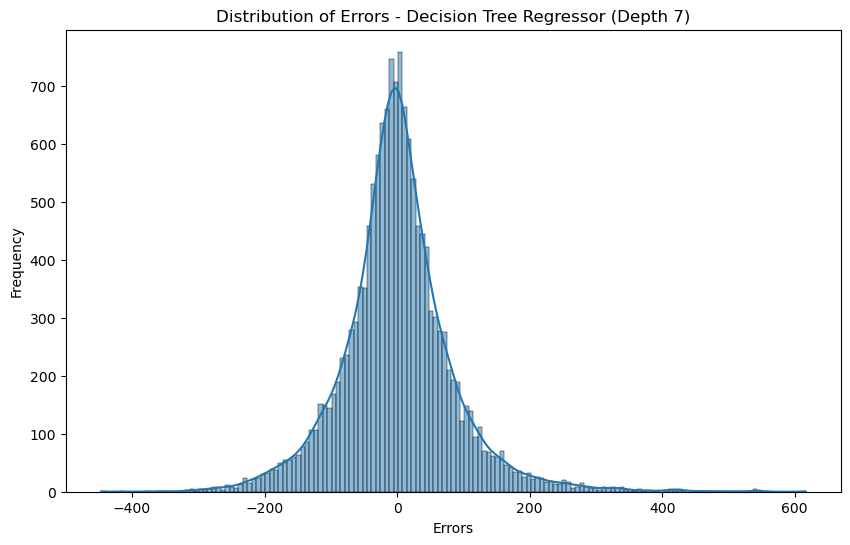

In [14]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

# Load and preprocess data (assuming df is already prepared as in your previous code)
df1 = pd.read_csv('./05_07_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
df2 = pd.read_csv('./25_06_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
df3 = pd.read_csv('./20_06_hotels_data_cleaned_with_new_parameters_encoded.csv')

# Merge the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Function to fill NaN values with the mean of the group
def fill_na_with_group_mean(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        df[col].fillna(df[col].mean(), inplace=True)
    return df

# Fill NaN values for the entire dataset
df = fill_na_with_group_mean(df)

# Keep only numeric columns
df = df.select_dtypes(include=[np.number])

# Remove columns with all NaN values
df = df.dropna(axis=1, how='all')


# Remove the price column
if 'price_per_night' in df.columns:
    df = df.drop(columns=['price_per_night'])
if 'checkout_day' in df.columns:
    df = df.drop(columns=['checkout_day'])
if 'checkin_day' in df.columns:
    df = df.drop(columns=['checkin_day'])

# Ensure there are no remaining NaN values
imputer = SimpleImputer(strategy='mean')
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Split data into train and test sets
X = df.drop(columns=['price'])
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define depths to experiment with
depths = [4, 5, 6, 7]

# Loop through each depth
for depth in depths:
    # Train the model
    model = DecisionTreeRegressor(max_depth=depth, random_state=42)
    model.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate error metrics for training set
    train_r2 = r2_score(y_train, y_train_pred)
    train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
    train_mae = mean_absolute_error(y_train, y_train_pred)
    
    # Calculate error metrics for test set
    test_r2 = r2_score(y_test, y_test_pred)
    test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    
    # Print error metrics
    print(f"Depth {depth}:")
    print(f"Training set - R²: {train_r2}, RMSE: {train_rmse}, MAE: {train_mae}")
    print(f"Test set - R²: {test_r2}, RMSE: {test_rmse}, MAE: {test_mae}")
    
    # Plot actual vs predicted prices
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=y_test_pred, alpha=0.6)
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title(f'Actual vs Predicted Prices - Decision Tree Regressor (Depth {depth})')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.show()
    
    # Residual plot
    residuals = y_test - y_test_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=residuals, alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Prices')
    plt.ylabel('Residuals')
    plt.title(f'Residuals Plot - Decision Tree Regressor (Depth {depth})')
    plt.show()
    
    # Error distribution plot
    errors = y_test - y_test_pred
    plt.figure(figsize=(10, 6))
    sns.histplot(errors, kde=True)
    plt.xlabel('Errors')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of Errors - Decision Tree Regressor (Depth {depth})')
    plt.show()



Training Decision Tree Regressor with depth 4
Error metrics for depth 4:
Training set - R²: 0.845528863808491, RMSE: 159.11280025670095, MSE: 25316.88320552881, MAE: 119.62319564110638
Test set - R²: 0.8711680006471479, RMSE: 137.04577687747752, MSE: 18781.544959951356, MAE: 103.48146291645206
Cross-Validation - R²: 0.7898324234926479, RMSE: 183.34762290074207, MSE: 34700.43997357901, MAE: 133.85385803917615


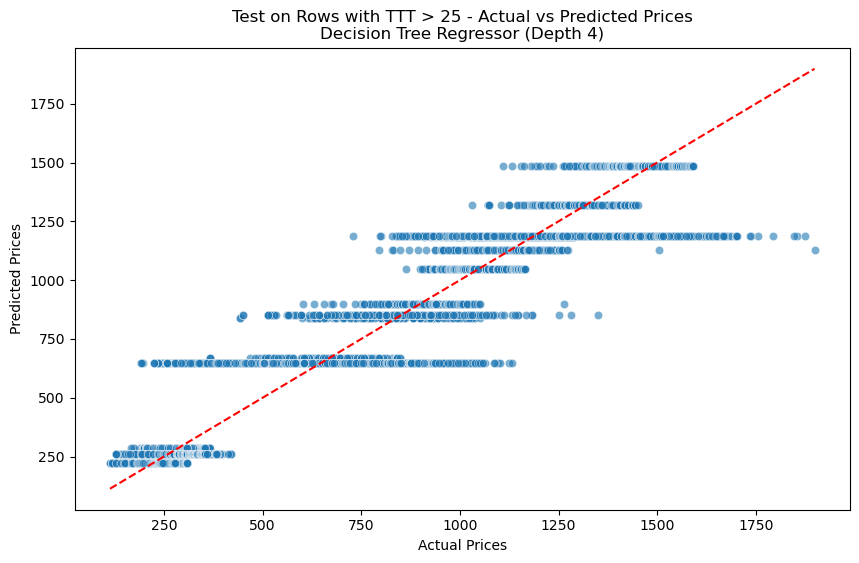

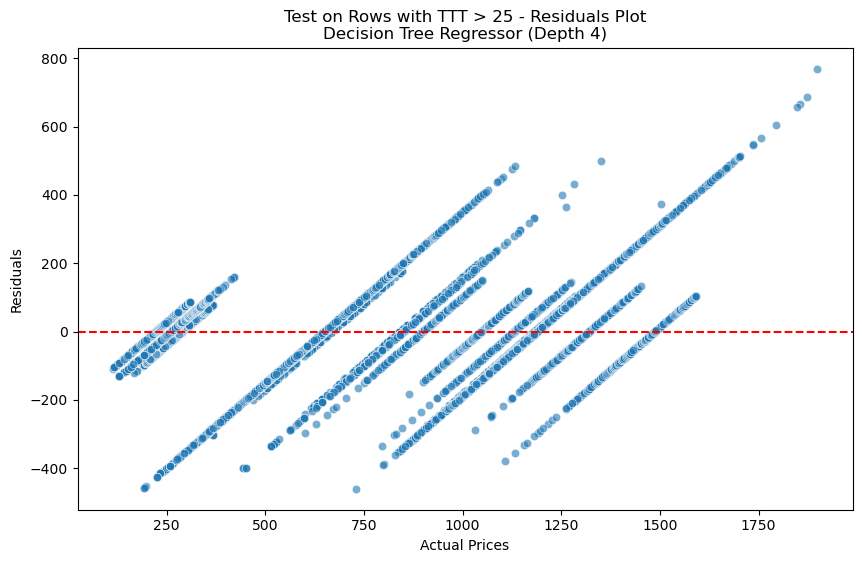

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


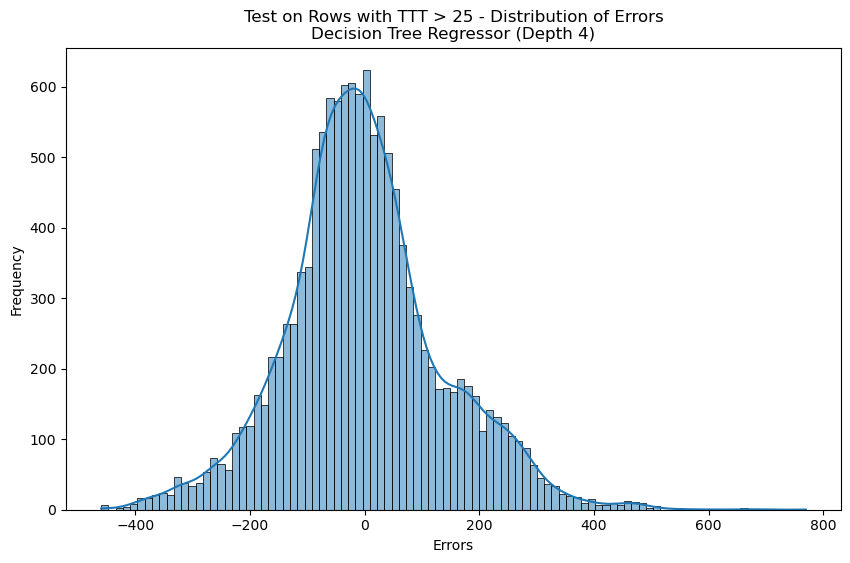


Training Decision Tree Regressor with depth 5
Error metrics for depth 5:
Training set - R²: 0.8834829261691333, RMSE: 138.1898779465041, MSE: 19096.442366869705, MAE: 101.67439763329538
Test set - R²: 0.9152550554554746, RMSE: 111.15031138112752, MSE: 12354.391720121606, MAE: 81.96768281610548
Cross-Validation - R²: 0.8204121975392727, RMSE: 169.41723581712822, MSE: 29307.25159557876, MAE: 122.44934834117012


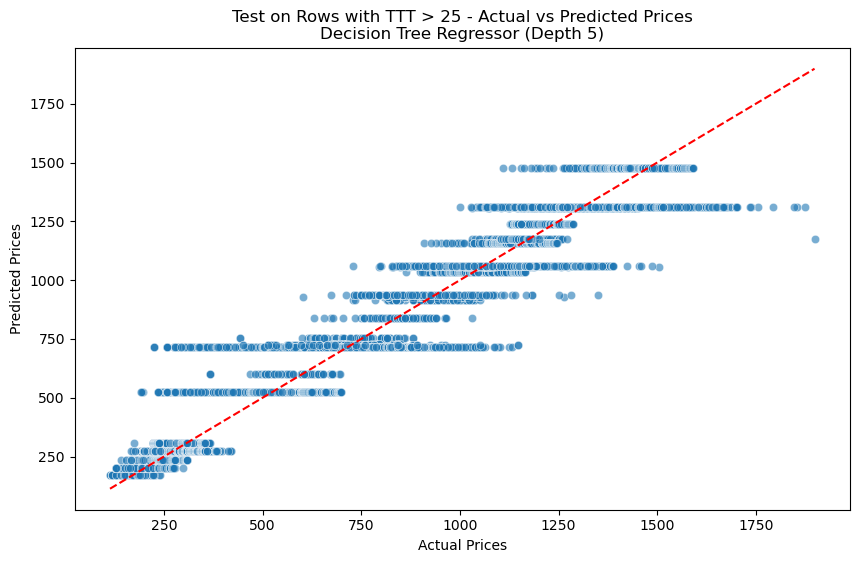

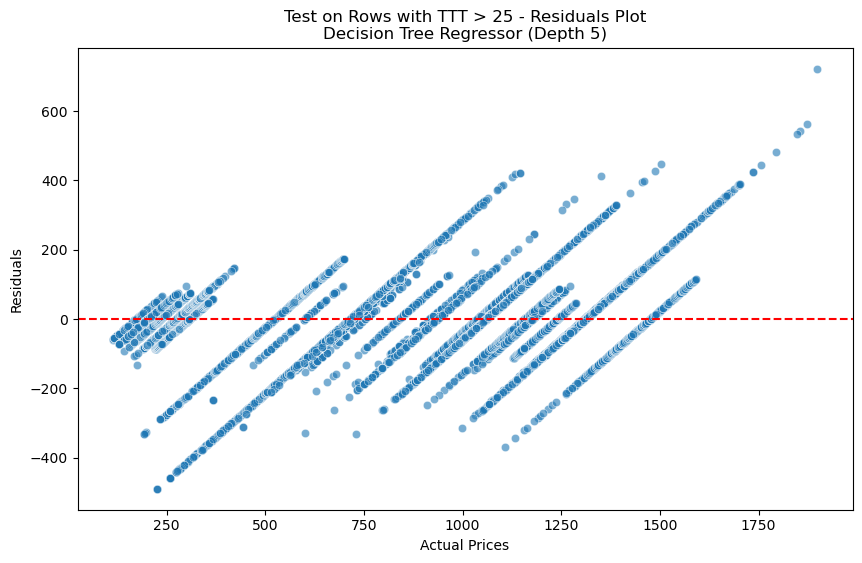

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


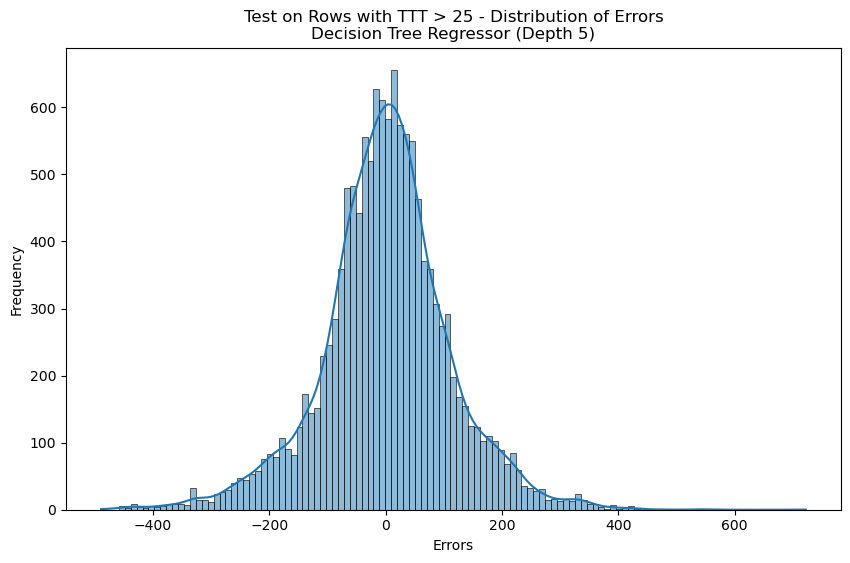


Training Decision Tree Regressor with depth 6
Error metrics for depth 6:
Training set - R²: 0.9148200512023872, RMSE: 118.1544644137745, MSE: 13960.477460905906, MAE: 85.71167860989482
Test set - R²: 0.943419673703628, RMSE: 90.82104771151585, MSE: 8248.462707417437, MAE: 66.23938757553123
Cross-Validation - R²: 0.8552409166681659, RMSE: 152.8901167460096, MSE: 24053.373657510576, MAE: 109.07993194347281


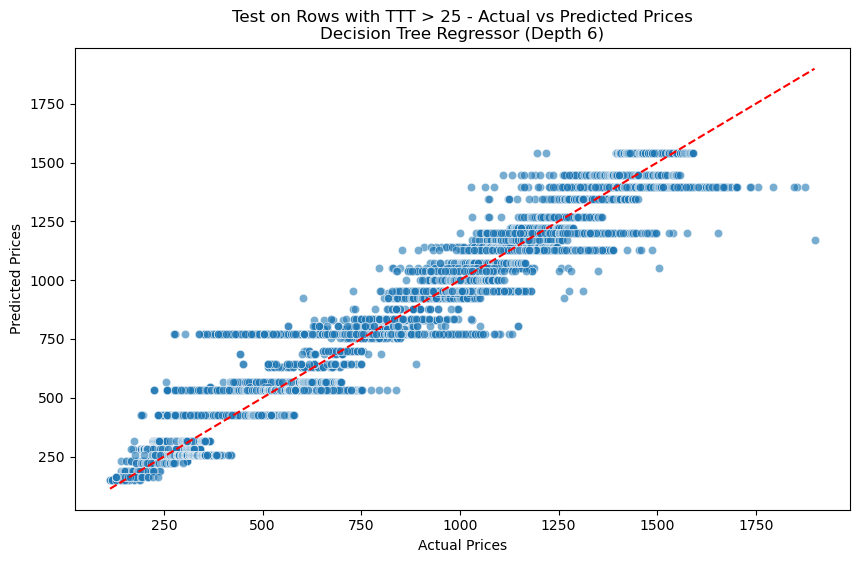

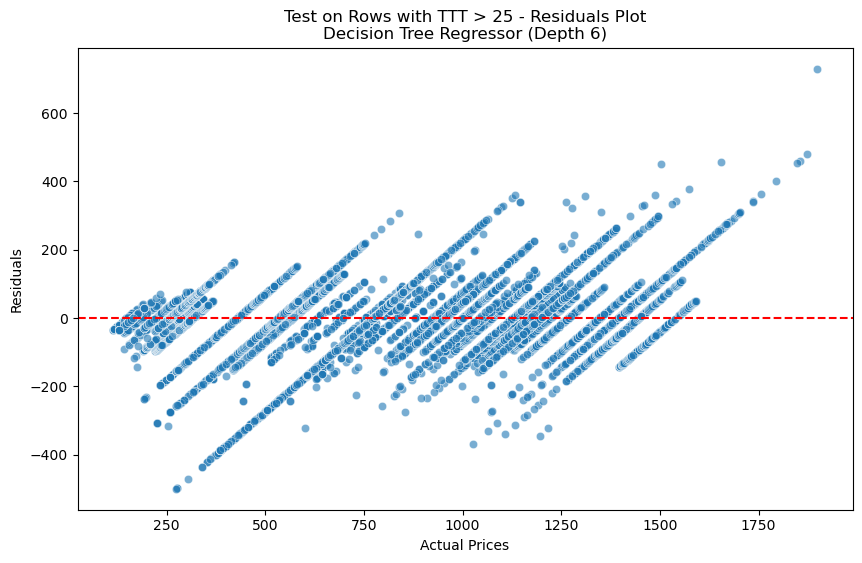

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


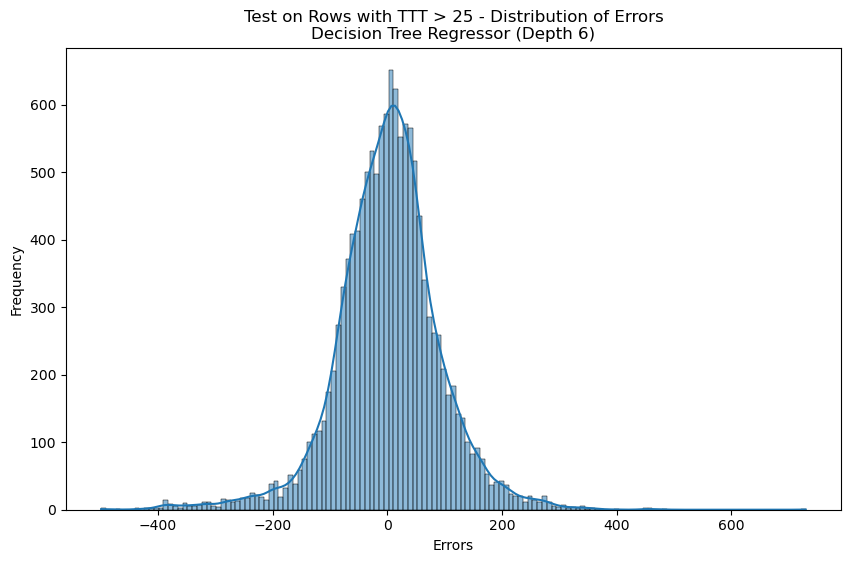


Training Decision Tree Regressor with depth 7
Error metrics for depth 7:
Training set - R²: 0.9357204352172469, RMSE: 102.64029991446914, MSE: 10535.031166532173, MAE: 74.46568406964857
Test set - R²: 0.9579454472648863, RMSE: 78.29973514091039, MSE: 6130.848523136717, MAE: 58.59495610889443
Cross-Validation - R²: 0.8588680280826073, RMSE: 150.7193502234325, MSE: 23631.04748965658, MAE: 105.42010859485015


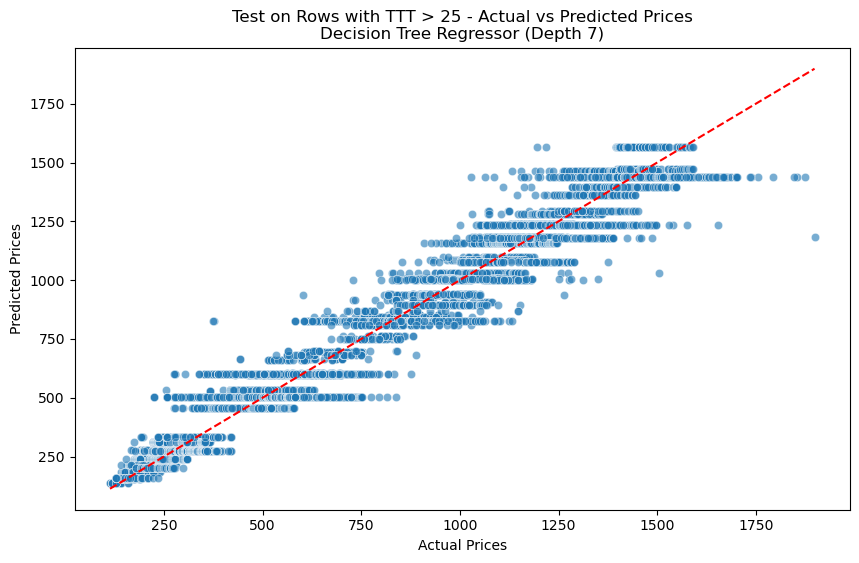

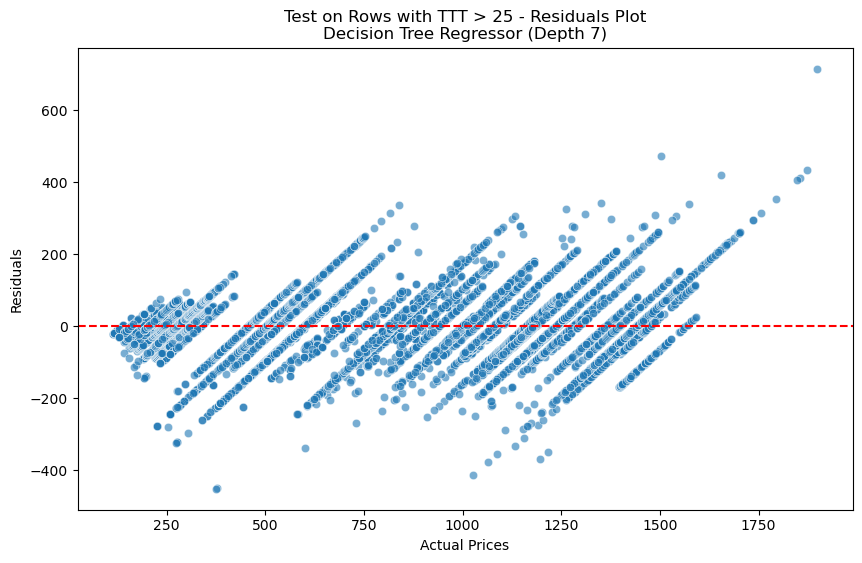

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


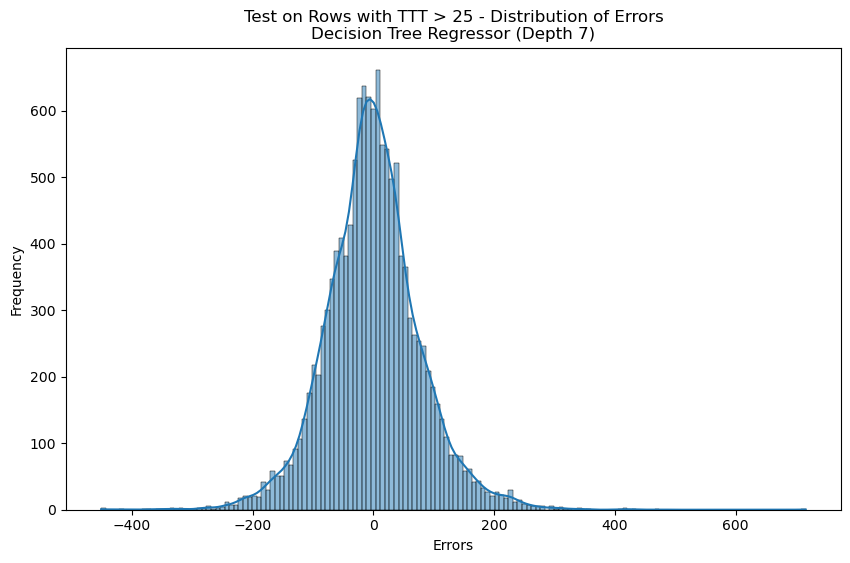


Training Decision Tree Regressor with depth 8
Error metrics for depth 8:
Training set - R²: 0.9495833101256494, RMSE: 90.9009899340639, MSE: 8262.989970992787, MAE: 64.89843251625983
Test set - R²: 0.9699080230230851, RMSE: 66.2337194566109, MSE: 4386.905593057038, MAE: 49.99407752318211
Cross-Validation - R²: 0.8454675414937262, RMSE: 157.1901049278278, MSE: 25711.477005756817, MAE: 111.39162168010387


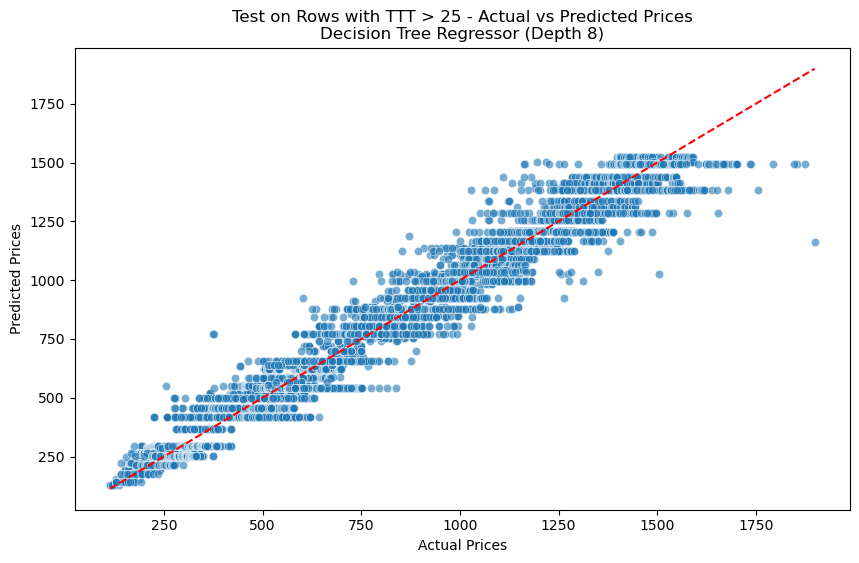

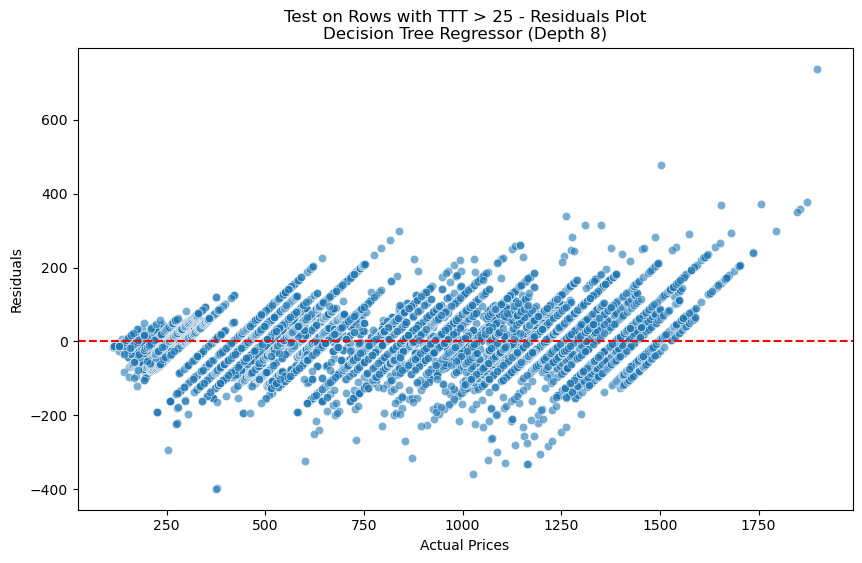

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


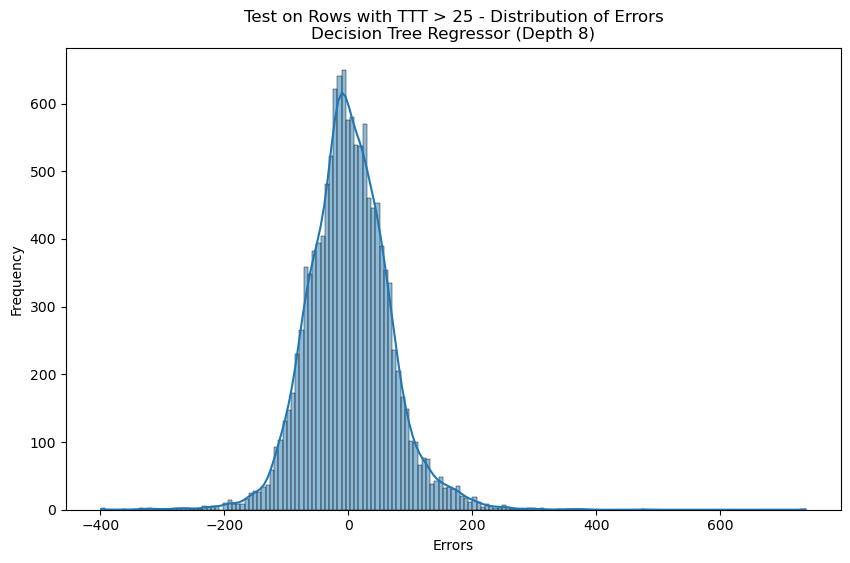


Training Decision Tree Regressor with depth 9
Error metrics for depth 9:
Training set - R²: 0.9607412125814443, RMSE: 80.21394747600367, MSE: 6434.2773696830745, MAE: 57.48527731271616
Test set - R²: 0.9673100400873729, RMSE: 69.03367248121224, MSE: 4765.647936243279, MAE: 52.70058207855079
Cross-Validation - R²: 0.8379977703870759, RMSE: 161.07901982690612, MSE: 26857.62855343325, MAE: 114.54862920573107


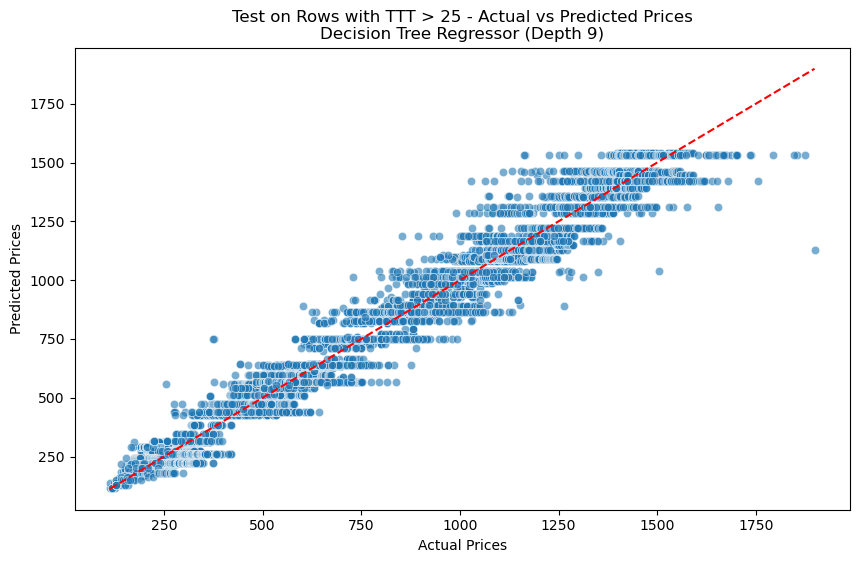

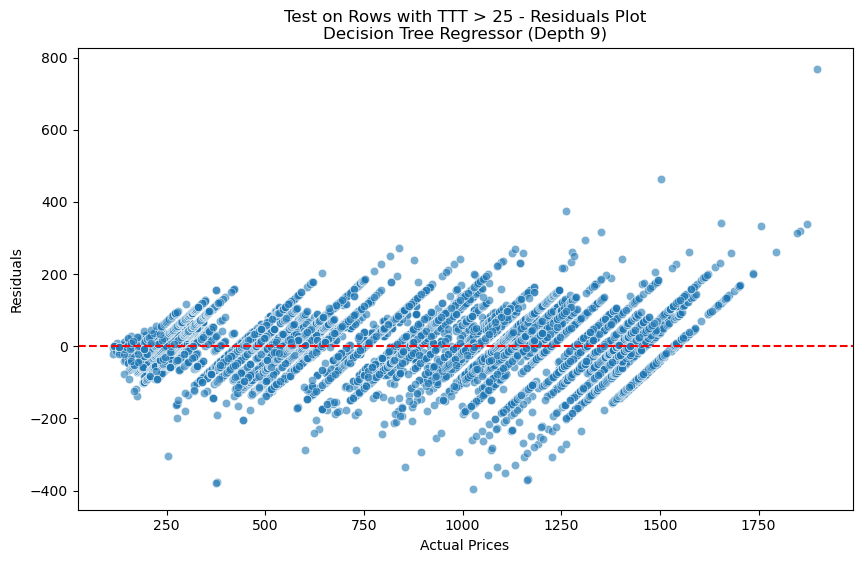

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


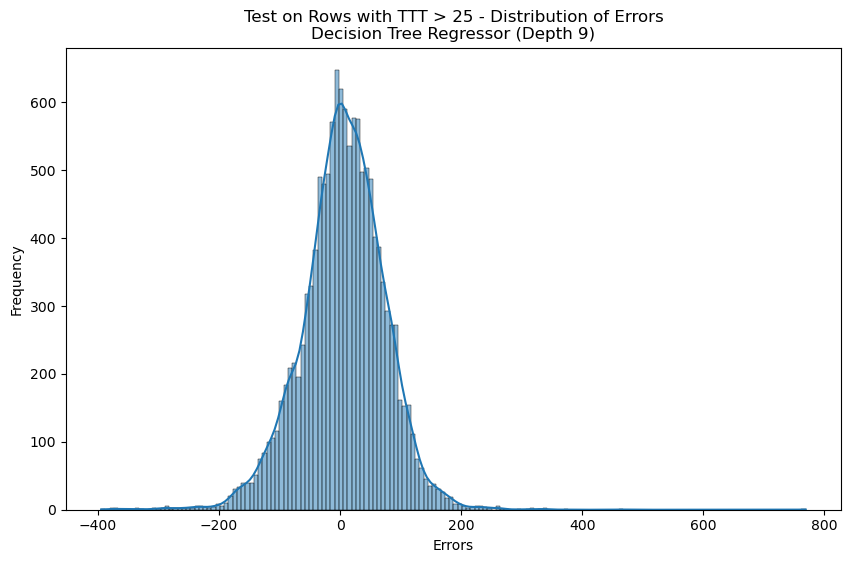

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

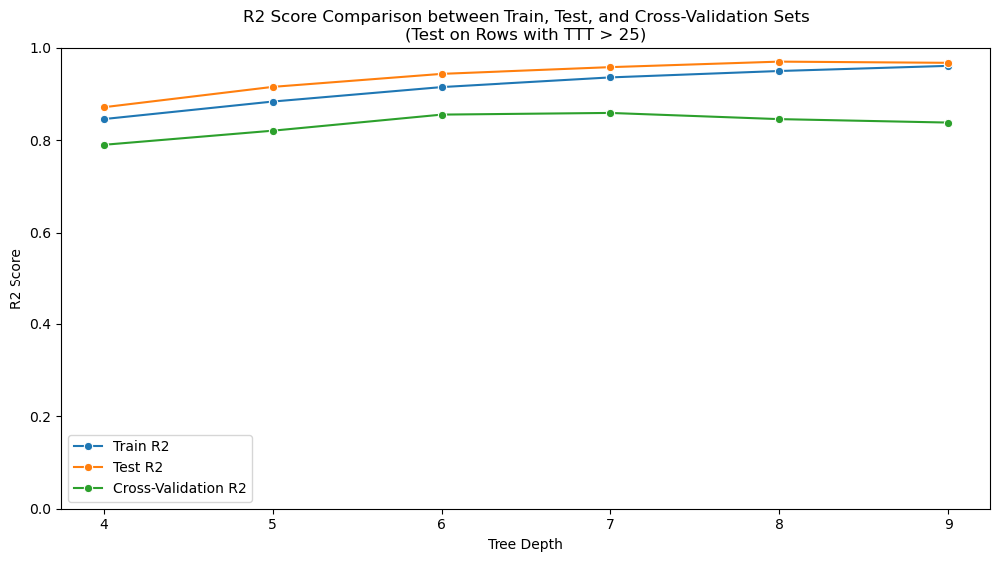

C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ronro\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

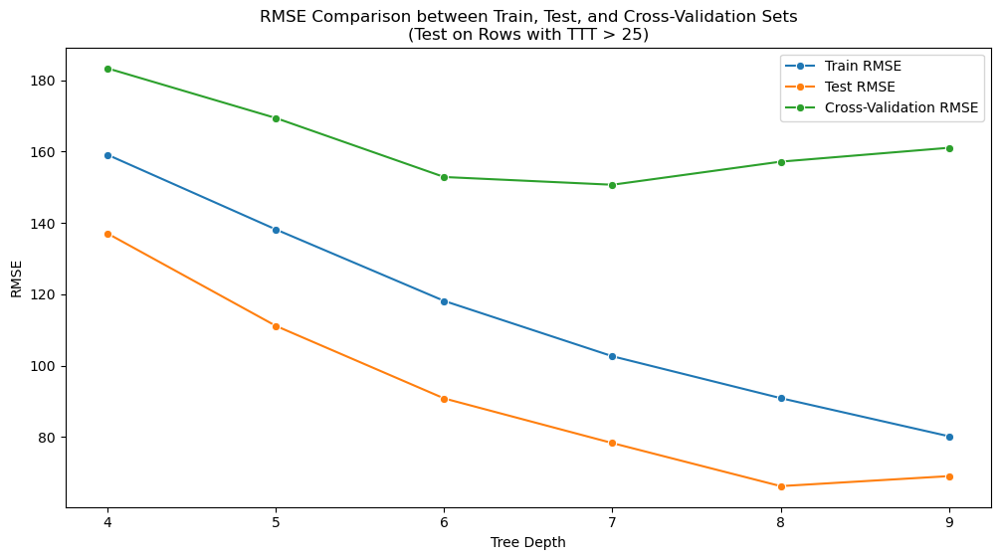

In [10]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, make_scorer
from sklearn.model_selection import cross_validate
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
#df1 = pd.read_csv('./05_07_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
#df2 = pd.read_csv('./25_06_hotels_data_cleaned_with_days_name_parameters_period_encoded.csv')
#df3 = pd.read_csv('./20_06_hotels_data_cleaned_with_new_parameters_encoded.csv')

df1 = pd.read_csv('./0507_cleaned_booking_hotels.csv')
df2 = pd.read_csv('./2506_cleaned_booking_hotels.csv')
df3 = pd.read_csv('./20_06_hotels_data_cleaned.csv')

# Merge the dataframes
df = pd.concat([df1, df2, df3], ignore_index=True)

# Function to fill NaN values with the mean of the group
def fill_na_with_group_mean(df):
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    for col in numeric_cols:
        df[col].fillna(df[col].mean(), inplace=True)
    return df

# Fill NaN values for the entire dataset
df = fill_na_with_group_mean(df)

# Keep only numeric columns
df = df.select_dtypes(include=[np.number])

# Remove columns with all NaN values
df = df.dropna(axis=1, how='all')

# Remove the price column
if 'price_per_night' in df.columns:
    df = df.drop(columns=['price_per_night'])

# Ensure there are no remaining NaN values
imputer = SimpleImputer(strategy='mean')
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Define train and test splits
df_train = df[df['TTT'] <= 25]
df_test = df[df['TTT'] > 25]

X_train_exp = df_train.drop(columns=['price'])
y_train_exp = df_train['price']
X_test_exp = df_test.drop(columns=['price'])
y_test_exp = df_test['price']

depths = [4, 5, 6, 7,8,9]
results = []

# Custom scoring function
scoring = {
    'r2': 'r2',
    'mse': make_scorer(mean_squared_error),
    'mae': make_scorer(mean_absolute_error),
    'rmse': make_scorer(mean_squared_error, squared=False)
}

for depth in depths:
    print(f"\nTraining Decision Tree Regressor with depth {depth}")

    # Train the model
    model_exp = DecisionTreeRegressor(max_depth=depth)
    model_exp.fit(X_train_exp, y_train_exp)
    
    # Predictions
    y_train_exp_pred = model_exp.predict(X_train_exp)
    y_test_exp_pred = model_exp.predict(X_test_exp)
    
    # Calculate error metrics for training set
    train_r2_exp = r2_score(y_train_exp, y_train_exp_pred)
    train_rmse_exp = mean_squared_error(y_train_exp, y_train_exp_pred, squared=False)
    train_mse_exp = mean_squared_error(y_train_exp, y_train_exp_pred)
    train_mae_exp = mean_absolute_error(y_train_exp, y_train_exp_pred)
    
    # Calculate error metrics for test set
    test_r2_exp = r2_score(y_test_exp, y_test_exp_pred)
    test_rmse_exp = mean_squared_error(y_test_exp, y_test_exp_pred, squared=False)
    test_mse_exp = mean_squared_error(y_test_exp, y_test_exp_pred)
    test_mae_exp = mean_absolute_error(y_test_exp, y_test_exp_pred)
    
    # Perform cross-validation and calculate the mean cross-validation scores
    cv_results = cross_validate(model_exp, X_train_exp, y_train_exp, cv=5, scoring=scoring)
    cv_mean_r2 = cv_results['test_r2'].mean()
    cv_mean_mse = cv_results['test_mse'].mean()
    cv_mean_mae = cv_results['test_mae'].mean()
    cv_mean_rmse = cv_results['test_rmse'].mean()
    
    # Store results
    results.append({
        'depth': depth,
        'train_r2': train_r2_exp,
        'train_rmse': train_rmse_exp,
        'train_mse': train_mse_exp,
        'train_mae': train_mae_exp,
        'test_r2': test_r2_exp,
        'test_rmse': test_rmse_exp,
        'test_mse': test_mse_exp,
        'test_mae': test_mae_exp,
        'cv_mean_r2': cv_mean_r2,
        'cv_mean_mse': cv_mean_mse,
        'cv_mean_mae': cv_mean_mae,
        'cv_mean_rmse': cv_mean_rmse
    })

    # Print error metrics
    print(f"Error metrics for depth {depth}:")
    print(f"Training set - R²: {train_r2_exp}, RMSE: {train_rmse_exp}, MSE: {train_mse_exp}, MAE: {train_mae_exp}")
    print(f"Test set - R²: {test_r2_exp}, RMSE: {test_rmse_exp}, MSE: {test_mse_exp}, MAE: {test_mae_exp}")
    print(f"Cross-Validation - R²: {cv_mean_r2}, RMSE: {cv_mean_rmse}, MSE: {cv_mean_mse}, MAE: {cv_mean_mae}")
    
    # Plot actual vs predicted prices
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test_exp, y=y_test_exp_pred, alpha=0.6)
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title(f'Test on Rows with TTT > 25 - Actual vs Predicted Prices\nDecision Tree Regressor (Depth {depth})')
    plt.plot([y_test_exp.min(), y_test_exp.max()], [y_test_exp.min(), y_test_exp.max()], color='red', linestyle='--')
    plt.show()

    # Residual plot
    residuals_exp = y_test_exp - y_test_exp_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test_exp, y=residuals_exp, alpha=0.6)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Actual Prices')
    plt.ylabel('Residuals')
    plt.title(f'Test on Rows with TTT > 25 - Residuals Plot\nDecision Tree Regressor (Depth {depth})')
    plt.show()

    # Plot error distribution
    errors_exp = y_test_exp - y_test_exp_pred
    plt.figure(figsize=(10, 6))
    sns.histplot(errors_exp, kde=True)
    plt.xlabel('Errors')
    plt.ylabel('Frequency')
    plt.title(f'Test on Rows with TTT > 25 - Distribution of Errors\nDecision Tree Regressor (Depth {depth})')
    plt.show()

# Convert results to DataFrame for easier plotting
results_df = pd.DataFrame(results)

# Plot R2 Score comparison between train, test, and cross-validation sets
plt.figure(figsize=(12, 6))
sns.lineplot(data=results_df, x='depth', y='train_r2', marker='o', label='Train R2')
sns.lineplot(data=results_df, x='depth', y='test_r2', marker='o', label='Test R2')
sns.lineplot(data=results_df, x='depth', y='cv_mean_r2', marker='o', label='Cross-Validation R2')
plt.ylim(0, 1)
plt.xlabel('Tree Depth')
plt.ylabel('R2 Score')
plt.title('R2 Score Comparison between Train, Test, and Cross-Validation Sets\n(Test on Rows with TTT > 25)')
plt.legend()
plt.show()

# Plot RMSE comparison between train, test, and cross-validation sets
plt.figure(figsize=(12, 6))
sns.lineplot(data=results_df, x='depth', y='train_rmse', marker='o', label='Train RMSE')
sns.lineplot(data=results_df, x='depth', y='test_rmse', marker='o', label='Test RMSE')
sns.lineplot(data=results_df, x='depth', y='cv_mean_rmse', marker='o', label='Cross-Validation RMSE')
plt.xlabel('Tree Depth')
plt.ylabel('RMSE')
plt.title('RMSE Comparison between Train, Test, and Cross-Validation Sets\n(Test on Rows with TTT > 25)')
plt.legend()
plt.show()


## Conclusions from changing the training and test groups:
It would seem that the test performance is very good, but when you look deeper into things, you can see through the cross-validation data that the model tends to over-train the deeper the decision tree.depth